#                                   Cars4U Project

## Description
## Background & Context

There is a huge demand for used cars in the Indian Market today. As sales of new cars have slowed down in the recent past, the pre-owned car market has continued to grow over the past years and is larger than the new car market now. Cars4U is a budding tech start-up that aims to find footholes in this market.

In 2018-19, while new car sales were recorded at 3.6 million units, around 4 million second-hand cars were bought and sold. There is a slowdown in new car sales and that could mean that the demand is shifting towards the pre-owned market. In fact, some car sellers replace their old cars with pre-owned cars instead of buying new ones. Unlike new cars, where price and supply are fairly deterministic and managed by OEMs (Original Equipment Manufacturer / except for dealership level discounts which come into play only in the last stage of the customer journey), used cars are very different beasts with huge uncertainty in both pricing and supply. Keeping this in mind, the pricing scheme of these used cars becomes important in order to grow in the market.

As a senior data scientist at Cars4U, you have to come up with a pricing model that can effectively predict the price of used cars and can help the business in devising profitable strategies using differential pricing. For example, if the business knows the market price, it will never sell anything below it. 

## Objective

- Explore and visualize the dataset.
- Build a linear regression model to predict the prices of used cars.
- Generate a set of insights and recommendations that will help the business.

## Data Dictionary 

* S.No. : Serial Number
* Name : Name of the car which includes Brand name and Model name
* Location : The location in which the car is being sold or is available for purchase Cities
* Year : Manufacturing year of the car
* Kilometers_driven : The total kilometers driven in the car by the previous owner(s) in KM.
* Fuel_Type : The type of fuel used by the car. (Petrol, Diesel, Electric, CNG, LPG)
* Transmission : The type of transmission used by the car. (Automatic / Manual)
* Owner : Type of ownership
* Mileage : The standard mileage offered by the car company in kmpl or km/kg
* Engine : The displacement volume of the engine in CC.
* Power : The maximum power of the engine in bhp.
* Seats : The number of seats in the car.
* New_Price : The price of a new car of the same model in INR Lakhs.(1 Lakh = 100, 000)
* Price : The price of the used car in INR Lakhs (1 Lakh = 100, 000)


In [1]:
#pip install numpy --upgrade --user
#pip install fancyimpute
#pip install mlxtend

## Import the necessary packages

In [2]:
# Import necessary libraries.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

import scipy.stats as stats

# Removes the limit from the number of displayed columns and rows.
# This is so I can see the entire dataframe when I print it
pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_rows', 200)

## Read the dataset

In [3]:
cars_data = pd.read_csv("/Users/srujana/Downloads/used_cars_data.csv")

In [4]:
# copying data to another varaible to avoid any changes to original data
usedcars_data = cars_data.copy()

## Verify if the data is loaded properly

In [5]:
usedcars_data.head()

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
0,0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,NaN,1.75
1,1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,NaN,12.50
2,2,Honda Jazz V,Chennai,2011,46000,Petrol,Manual,First,18.2 kmpl,1199 CC,88.7 bhp,5.0,8.61 Lakh,4.50
3,3,Maruti Ertiga VDI,Chennai,2012,87000,Diesel,Manual,First,20.77 kmpl,1248 CC,88.76 bhp,7.0,NaN,6.00
4,4,Audi A4 New 2.0 TDI Multitronic,Coimbatore,2013,40670,Diesel,Automatic,Second,15.2 kmpl,1968 CC,140.8 bhp,5.0,NaN,17.74


## View the shape of the dataset

In [6]:
usedcars_data.shape

(7253, 14)

In [7]:
print(f'Dataset has {usedcars_data.shape[0]} rows and {usedcars_data.shape[1]} columns.')  # f-string

Dataset has 7253 rows and 14 columns.


## Look at randomly selected 10 rows

In [8]:
np.random.seed(1)
usedcars_data.sample(n=10)

,S.No.,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
2397,2397,Ford EcoSport 1.5 Petrol Trend,Kolkata,2016,21460,Petrol,Manual,First,17.0 kmpl,1497 CC,121.36 bhp,5.0,9.47 Lakh,6.00
3777,3777,Maruti Wagon R VXI 1.2,Kochi,2015,49818,Petrol,Manual,First,21.5 kmpl,1197 CC,81.80 bhp,5.0,5.44 Lakh,4.11
4425,4425,Ford Endeavour 4x2 XLT,Hyderabad,2007,130000,Diesel,Manual,First,13.1 kmpl,2499 CC,141 bhp,7.0,NaN,6.00
3661,3661,Mercedes-Benz E-Class E250 CDI Avantgrade,Coimbatore,2016,39753,Diesel,Automatic,First,13.0 kmpl,2143 CC,201.1 bhp,5.0,NaN,35.28
4514,4514,Hyundai Xcent 1.2 Kappa AT SX Option,Kochi,2016,45560,Petrol,Automatic,First,16.9 kmpl,1197 CC,82 bhp,5.0,NaN,6.34
599,599,Toyota Innova Crysta 2.8 ZX AT,Coimbatore,2019,40674,Diesel,Automatic,First,11.36 kmpl,2755 CC,171.5 bhp,7.0,28.05 Lakh,24.82
186,186,Mercedes-Benz E-Class E250 CDI Avantgrade,Bangalore,2014,37382,Diesel,Automatic,First,13.0 kmpl,2143 CC,201.1 bhp,5.0,NaN,32.00
305,305,Audi A6 2011-2015 2.0 TDI Premium Plus,Kochi,2014,61726,Diesel,Automatic,First,17.68 kmpl,1968 CC,174.33 bhp,5.0,NaN,20.77
4582,4582,Hyundai i20 1.2 Magna,Kolkata,2011,36000,Petrol,Manual,First,18.5 kmpl,1197 CC,80 bhp,5.0,NaN,2.50
5434,5434,Honda WR-V Edge Edition i-VTEC S,Kochi,2019,13913,Petrol,Manual,First,17.5 kmpl,1199 CC,88.7 bhp,5.0,9.36 Lakh,8.20


- From these random 10 rows, we can say that S.No column can be safely dropped as it doesnt carry any information related to the topic in hand.
- We can also see that some columns are represented as strings when we expect them to be numeric. They are represented as objects as they are carrying units along with the magnitude. So,we need to remove the units for some of the columns and some columns needs conversion.Some columns like price and New Price are specified in terms of lakhs and crores, which needs to be converted into number for easy comaprision.
- This preview also shows that New price column potentially has a lot of missingness so we'll want to make sure to look into that.


In [9]:
usedcars_data.drop(['S.No.'],axis=1,inplace=True)

In [10]:
usedcars_data.shape

(7253, 13)

## Check the columns

In [11]:
#View the column names
usedcars_data.columns

Index(['Name', 'Location', 'Year', 'Kilometers_Driven', 'Fuel_Type',
       'Transmission', 'Owner_Type', 'Mileage', 'Engine', 'Power', 'Seats',
       'New_Price', 'Price'],
      dtype='object')

## Count the datatypes

In [12]:
#count the number of variables in each datatype
usedcars_data.dtypes.value_counts()

object     9
float64    2
int64      2
dtype: int64

## Verify if there are any duplicates

In [13]:
sum(usedcars_data.duplicated())

1

Considering that there could be another car of same model,from same location and same number of miles put on it by coincidence, lets not remove it.

## Check the data types of the columns for the dataset.

In [14]:
usedcars_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7253 entries, 0 to 7252
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Name               7253 non-null   object 
 1   Location           7253 non-null   object 
 2   Year               7253 non-null   int64  
 3   Kilometers_Driven  7253 non-null   int64  
 4   Fuel_Type          7253 non-null   object 
 5   Transmission       7253 non-null   object 
 6   Owner_Type         7253 non-null   object 
 7   Mileage            7251 non-null   object 
 8   Engine             7207 non-null   object 
 9   Power              7207 non-null   object 
 10  Seats              7200 non-null   float64
 11  New_Price          1006 non-null   object 
 12  Price              6019 non-null   float64
dtypes: float64(2), int64(2), object(9)
memory usage: 736.8+ KB


Observations:
All the columns are either of type object, int64 or float64.

Year and Kilometers_Driven columns are of integer data type.

Name, Location,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power and New_Price columns are of object datatype.
we can change Name,Location,Fuel_Type,Transmission and Owner_Type to categories. Converting "objects" to "category" reduces the data space required to store the dataframe.

Seats and Price are of float64 datatypes.

Price is the Dependent Variable

## 3. Processing columns(Data PreProcessing)
I want to get summary statistics and start getting a sense of the distributions of these variables and how they relate to each other, but first I need to turn many of these into numeric columns.

In [15]:
price_cols = []
for colname in usedcars_data.columns[usedcars_data.dtypes == 'object']:  # only need to consider string columns
    if usedcars_data[colname].str.endswith('Lakh').any():  # using `.str` so I can use an element-wise string method
        price_cols.append(colname)
    elif usedcars_data[colname].str.endswith('Cr').any():  # using `.str` so I can use an element-wise string method
        price_cols.append(colname)
print(price_cols)

['New_Price']


In [16]:
usedcars_data['New_Price'].head()

0          NaN
1          NaN
2    8.61 Lakh
3          NaN
4          NaN
Name: New_Price, dtype: object

In [17]:
def price_to_num(price_val):
    """This function takes in a string representing a Price in Lakhs and Crores
    and converts it to a number. For example, '1Lakh' becomes 1,00,000.
    If the input is already numeric, which probably means it's NaN,
    this function just returns np.nan."""
    if isinstance(price_val, str):  # checks if `income_val` is a string
        multiplier = 1  # handles K vs M salaries
        if price_val.endswith('Lakh'):
            multiplier = 100000
        elif price_val.endswith('Cr'):
            multiplier = 10000000
        return float(price_val.replace('Lakh', '').replace('Cr', '')) * multiplier
    else:  # this happens when the price is np.nan
        return np.nan

for colname in price_cols:
    usedcars_data[colname] = usedcars_data[colname].apply(price_to_num)


In [18]:
usedcars_data['New_Price'].head()

0         NaN
1         NaN
2    861000.0
3         NaN
4         NaN
Name: New_Price, dtype: float64

In [19]:
# Lets view the Price variable, which is specified in terms of lakhs
usedcars_data['Price'].head()

0     1.75
1    12.50
2     4.50
3     6.00
4    17.74
Name: Price, dtype: float64

In [20]:
# Function to convert the price variable into actual number 
def price_in_lakh(price_val):
    multiplier1=100000
    if price_val!= np.nan:
         return float(price_val) * multiplier1
        
    else:
        return np.nan
    
usedcars_data['Price'] = usedcars_data['Price'].apply(price_in_lakh)
usedcars_data['Price']

0        175000.0
1       1250000.0
2        450000.0
3        600000.0
4       1774000.0
          ...    
7248          NaN
7249          NaN
7250          NaN
7251          NaN
7252          NaN
Name: Price, Length: 7253, dtype: float64

In [21]:
usedcars_data.head(2)

,Name,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price
0,Maruti Wagon R LXI CNG,Mumbai,2010,72000,CNG,Manual,First,26.6 km/kg,998 CC,58.16 bhp,5.0,NaN,175000.0
1,Hyundai Creta 1.6 CRDi SX Option,Pune,2015,41000,Diesel,Manual,First,19.67 kmpl,1582 CC,126.2 bhp,5.0,NaN,1250000.0


### Splitting Mileage variable value and Units

In [22]:
usedcars_data["Mileage"].head()

0    26.6 km/kg
1    19.67 kmpl
2     18.2 kmpl
3    20.77 kmpl
4     15.2 kmpl
Name: Mileage, dtype: object

In [23]:
# Extracting the Mileage value by saparating the units
Mileage_kmpl_kmkg=usedcars_data["Mileage"].str.split(" ",n=1,expand=True)
usedcars_data["Mileage"]=Mileage_kmpl_kmkg[0]

In [24]:
usedcars_data['Mileage'] = usedcars_data['Mileage'].astype('float')

In [25]:
usedcars_data["Mileage"].head()

0    26.60
1    19.67
2    18.20
3    20.77
4    15.20
Name: Mileage, dtype: float64

### Splitting Engine variable value and Units

In [26]:
usedcars_data["Engine"].head()

0     998 CC
1    1582 CC
2    1199 CC
3    1248 CC
4    1968 CC
Name: Engine, dtype: object

In [27]:
Engine_CC=usedcars_data["Engine"].str.split(" ",n=1,expand=True)
usedcars_data["Engine"]=Engine_CC[0]

In [28]:
usedcars_data['Engine'] = usedcars_data['Engine'].astype('float')

In [29]:
usedcars_data["Engine"].head()

0     998.0
1    1582.0
2    1199.0
3    1248.0
4    1968.0
Name: Engine, dtype: float64

### Splitting Power Variable value and units

In [30]:
usedcars_data["Power"].head()

0    58.16 bhp
1    126.2 bhp
2     88.7 bhp
3    88.76 bhp
4    140.8 bhp
Name: Power, dtype: object

In [31]:
Power_bhp=usedcars_data["Power"].str.split(" ",n=1,expand=True)
usedcars_data["Power"]=Power_bhp[0]

In [32]:
#usedcars_data['Power'] = usedcars_data['Power'].astype('float')
usedcars_data['Power']  = pd.to_numeric(usedcars_data['Power'] , errors='coerce')

In [33]:
usedcars_data["Power"].head()

0     58.16
1    126.20
2     88.70
3     88.76
4    140.80
Name: Power, dtype: float64

### Split the Name field into Car make and model

In [34]:
Car_Name=usedcars_data["Name"].str.split(" ",n=1,expand=True)
usedcars_data["Car_make"]=Car_Name[0].str.upper()
usedcars_data.drop(['Name'], axis=1, inplace=True)

In [35]:
usedcars_data["Car_make"]=Car_Name[0].str.upper()

In [36]:
usedcars_data["Car_make"].head()

0     MARUTI
1    HYUNDAI
2      HONDA
3     MARUTI
4       AUDI
Name: Car_make, dtype: object

In [37]:
usedcars_data["Car_make"].nunique()

32

In [38]:
usedcars_data.Car_make.unique()

array(['MARUTI', 'HYUNDAI', 'HONDA', 'AUDI', 'NISSAN', 'TOYOTA',
       'VOLKSWAGEN', 'TATA', 'LAND', 'MITSUBISHI', 'RENAULT',
       'MERCEDES-BENZ', 'BMW', 'MAHINDRA', 'FORD', 'PORSCHE', 'DATSUN',
       'JAGUAR', 'VOLVO', 'CHEVROLET', 'SKODA', 'MINI', 'FIAT', 'JEEP',
       'SMART', 'AMBASSADOR', 'ISUZU', 'FORCE', 'BENTLEY', 'LAMBORGHINI',
       'HINDUSTAN', 'OPELCORSA'], dtype=object)

In [39]:
#Correcting the Car make/car company names
usedcars_data.Car_make = usedcars_data.Car_make.str.upper()

def replace_name(a,b):
    usedcars_data.Car_make.replace(a,b,inplace=True)

replace_name('LAND','LAND-ROVER')
replace_name('MINI','MINI-COOPER')
replace_name('HINDUSTAN','HINDUSTAN-MOTORS')
replace_name('SMART','SMART-FORTWO')
replace_name('FORCE','FORCE-ONE')

usedcars_data.Car_make.unique()

array(['MARUTI', 'HYUNDAI', 'HONDA', 'AUDI', 'NISSAN', 'TOYOTA',
       'VOLKSWAGEN', 'TATA', 'LAND-ROVER', 'MITSUBISHI', 'RENAULT',
       'MERCEDES-BENZ', 'BMW', 'MAHINDRA', 'FORD', 'PORSCHE', 'DATSUN',
       'JAGUAR', 'VOLVO', 'CHEVROLET', 'SKODA', 'MINI-COOPER', 'FIAT',
       'JEEP', 'SMART-FORTWO', 'AMBASSADOR', 'ISUZU', 'FORCE-ONE',
       'BENTLEY', 'LAMBORGHINI', 'HINDUSTAN-MOTORS', 'OPELCORSA'],
      dtype=object)

### categorizing Location variable into 4 regions

In [40]:
#Locations DIVIDED into 4 regions
Loc_Region={'Delhi':'North',
            'Jaipur':'North',
            'Bangalore':'South' ,
            'Hyderabad':'South',
            'Chennai':'South',
            'Coimbatore':'South',
            'Kochi':'South',
            'Kolkata':'East',
            'Mumbai':'West',
            'Pune':'West',
            'Ahmedabad':'West'
           }
usedcars_data['Loc_Region'] = usedcars_data.Location.map(Loc_Region)

In [41]:
usedcars_data[['Loc_Region','Location']]

,Loc_Region,Location
0,West,Mumbai
1,West,Pune
2,South,Chennai
3,South,Chennai
4,South,Coimbatore
...,...,...
7248,South,Hyderabad
7249,West,Mumbai
7250,East,Kolkata
7251,West,Pune


## Statistical summary for the dataset.

In [42]:
usedcars_data.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Location,7253,11,Mumbai,949,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Year,7253,NaN,NaN,NaN,2013.37,3.25442,1996,2011,2014,2016,2019
Kilometers_Driven,7253,NaN,NaN,NaN,58699.1,84427.7,171,34000,53416,73000,6.5e+06
Fuel_Type,7253,5,Diesel,3852,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Transmission,7253,2,Manual,5204,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Owner_Type,7253,4,First,5952,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Mileage,7251,NaN,NaN,NaN,18.1416,4.5622,0,15.17,18.16,21.1,33.54
Engine,7207,NaN,NaN,NaN,1616.57,595.285,72,1198,1493,1968,5998
Power,7078,NaN,NaN,NaN,112.765,53.4936,34.2,75,94,138.1,616
Seats,7200,NaN,NaN,NaN,5.27972,0.81166,0,5,5,5,10


Observations:
- The Location variable has 11 unique values and Mumbai location has more number of records compared to other locations.
- Kilometers Driven variable appears to be highly right skewed.This shows that some cars have lot of miles/kilometers put one them(driven alot).
- Price variable shows some skewness towards right indicating there are some expensive cars.
- The year variable has values from 1996 to 2019
- The Fuel type has 5 unique values.
- The transmission variable 2 unique value Manual cars appears to be the most.
- The Owner type variable has 4 unique values with "first" owner type being the most frequent.
- The Car make variable has 33 unique values and Maruti being sold more than other cars.
- Seats appears to be a categorical variable ranging from 0-10 seats and 5 seater being the most popular. There can not be zero car seats. So,it has to be fixed.
- Mileage columns has 0 as mileage for some records and this needs to be fixed.

### Fixing datatypes

In [43]:
usedcars_data["Car_make"]=usedcars_data["Car_make"].astype("category")
usedcars_data["Year"]=usedcars_data["Year"].astype("category")
usedcars_data["Location"]=usedcars_data["Location"].astype("category")
usedcars_data["Loc_Region"]=usedcars_data["Loc_Region"].astype("category")
usedcars_data["Fuel_Type"]=usedcars_data["Fuel_Type"].astype("category")
usedcars_data["Transmission"]=usedcars_data["Transmission"].astype("category")
usedcars_data["Owner_Type"]=usedcars_data["Owner_Type"].astype("category")
usedcars_data["Seats"]=usedcars_data["Seats"].astype("category")

In [44]:
usedcars_data.dtypes

Location             category
Year                 category
Kilometers_Driven       int64
Fuel_Type            category
Transmission         category
Owner_Type           category
Mileage               float64
Engine                float64
Power                 float64
Seats                category
New_Price             float64
Price                 float64
Car_make             category
Loc_Region           category
dtype: object

## Data profiling using Pandas Profiling to look at the EDA

In [45]:
from pandas_profiling import ProfileReport

profile = ProfileReport(usedcars_data)
# to view report created by pandas profile
profile

In [46]:
# to save report obtained via pandas profiling
profile.to_file('/Users/srujana/Downloads/Usedcars_data_output.html')

### Encoding the Variables into Numeric values

In [47]:
usedcars_data.head()

,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price,Car_make,Loc_Region
0,Mumbai,2010,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,NaN,175000.0,MARUTI,West
1,Pune,2015,41000,Diesel,Manual,First,19.67,1582.0,126.20,5.0,NaN,1250000.0,HYUNDAI,West
2,Chennai,2011,46000,Petrol,Manual,First,18.20,1199.0,88.70,5.0,861000.0,450000.0,HONDA,South
3,Chennai,2012,87000,Diesel,Manual,First,20.77,1248.0,88.76,7.0,NaN,600000.0,MARUTI,South
4,Coimbatore,2013,40670,Diesel,Automatic,Second,15.20,1968.0,140.80,5.0,NaN,1774000.0,AUDI,South


In [48]:
#Lets separate string columns and the other columns that are not needed to be passed while imputation
usedcars_data_cat=usedcars_data[['Location','Fuel_Type', 'Transmission','Owner_Type',"Loc_Region",'Car_make','Price']]

In [49]:
usedcars_data_cat.shape

(7253, 7)

In [50]:
usedcars_data.head(2)

,Location,Year,Kilometers_Driven,Fuel_Type,Transmission,Owner_Type,Mileage,Engine,Power,Seats,New_Price,Price,Car_make,Loc_Region
0,Mumbai,2010,72000,CNG,Manual,First,26.60,998.0,58.16,5.0,NaN,175000.0,MARUTI,West
1,Pune,2015,41000,Diesel,Manual,First,19.67,1582.0,126.20,5.0,NaN,1250000.0,HYUNDAI,West


In [51]:
#Removing "_" from the columns names
usedcars_data.columns = [col.replace('_','') for col in usedcars_data.columns]

In [52]:
usedcars_data.shape

(7253, 14)

## Heatmap for Non-Null Values

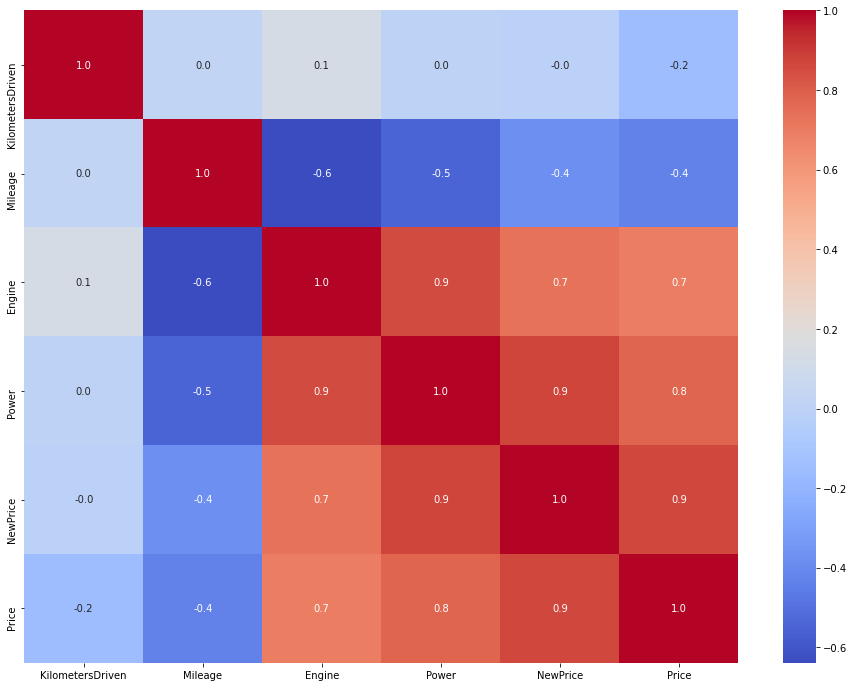

In [53]:
corr=usedcars_data[usedcars_data.NewPrice.notnull()].corr()
plt.figure(figsize=(16,12))
sns.heatmap(corr, annot=True,cmap='coolwarm',
        fmt=".1f",
        xticklabels=corr.columns,
        yticklabels=corr.columns);

Observations:
- Dependent variable Price is highly correlated with independent variables Newprice, Power and strongly correlated with Engine.
- Similarly NewPrice is highly correlated with price, Power and strongly correlated with Engine.
- Power has very high correlation with Engine and Newprice.
- Mileage is negatively correlated with Price,Newprice,Power and Engine.

### Creating dummy variables for Fuel_Type,Transimission,Owner_Type and Location Variables

In [54]:
usedcars_data=pd.get_dummies(usedcars_data, columns=["FuelType", "Transmission","OwnerType","LocRegion"],prefix=["Fuel", "Transmission","Owner","Region"], drop_first=True)



In [55]:
usedcars_data.head(2)

,Location,Year,KilometersDriven,Mileage,Engine,Power,Seats,NewPrice,Price,Carmake,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West
0,Mumbai,2010,72000,26.60,998.0,58.16,5.0,NaN,175000.0,MARUTI,0,0,0,0,1,0,0,0,0,0,1
1,Pune,2015,41000,19.67,1582.0,126.20,5.0,NaN,1250000.0,HYUNDAI,1,0,0,0,1,0,0,0,0,0,1


In [56]:
usedcars_data.shape

(7253, 21)

## Let's fix Mileage column with 0.0 Mileage and Seats column with zero seats.
Lets make it null so that we can apply imputaion models like KNN or Fancy imputation

In [57]:
usedcars_data[usedcars_data['Mileage']==0]

,Location,Year,KilometersDriven,Mileage,Engine,Power,Seats,NewPrice,Price,Carmake,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West
14,Pune,2012,85000,0.0,2179.0,115.00,5.0,NaN,1750000.0,LAND-ROVER,1,0,0,0,0,0,1,0,0,0,1
67,Coimbatore,2019,15369,0.0,1950.0,194.00,5.0,4914000.0,3567000.0,MERCEDES-BENZ,1,0,0,0,0,0,0,0,0,1,0
79,Hyderabad,2005,87591,0.0,1086.0,NaN,5.0,NaN,130000.0,HYUNDAI,0,0,0,1,1,0,0,0,0,1,0
194,Ahmedabad,2007,60006,0.0,NaN,NaN,NaN,NaN,295000.0,HONDA,0,0,0,1,1,0,0,0,0,0,1
229,Bangalore,2015,70436,0.0,1498.0,99.00,NaN,NaN,360000.0,FORD,1,0,0,0,1,0,0,0,0,1,0
262,Hyderabad,2006,99000,0.0,1086.0,NaN,5.0,NaN,175000.0,HYUNDAI,0,0,0,1,1,0,0,0,0,1,0
307,Chennai,2006,58000,0.0,1086.0,NaN,5.0,NaN,150000.0,HYUNDAI,0,0,0,1,1,0,1,0,0,1,0
424,Hyderabad,2010,42021,0.0,1968.0,NaN,5.0,NaN,545000.0,VOLKSWAGEN,1,0,0,0,1,0,0,0,0,1,0
443,Coimbatore,2012,50243,0.0,1086.0,NaN,5.0,NaN,335000.0,HYUNDAI,0,0,0,1,1,0,0,0,0,1,0
544,Kochi,2019,13190,0.0,1950.0,181.43,5.0,4949000.0,3899000.0,MERCEDES-BENZ,0,0,0,1,0,0,0,0,0,1,0


In [58]:
usedcars_data[usedcars_data['Seats']==0]

,Location,Year,KilometersDriven,Mileage,Engine,Power,Seats,NewPrice,Price,Carmake,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West
3999,Hyderabad,2012,125000,10.5,3197.0,NaN,0.0,NaN,1800000.0,AUDI,0,0,0,1,0,0,0,0,0,1,0


In [59]:

usedcars_data['Mileage']. replace(0.0,np. nan,inplace=True)
usedcars_data['Seats']. replace(0.0,np. nan,inplace=True)

In [60]:
usedcars_data[usedcars_data['Mileage']==0]

,Location,Year,KilometersDriven,Mileage,Engine,Power,Seats,NewPrice,Price,Carmake,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West


### There are no more records with 0.0 Mileage.

In [61]:
usedcars_data[usedcars_data['Seats']==0]

,Location,Year,KilometersDriven,Mileage,Engine,Power,Seats,NewPrice,Price,Carmake,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West


### There are no more records with 0 seats.

## Lets us look at missing values

In [62]:
# looking at which columns have the most missing values
usedcars_data.isnull().sum().sort_values(ascending=False) 

NewPrice                6247
Price                   1234
Power                    175
Mileage                   83
Seats                     54
Engine                    46
Region_West                0
Carmake                    0
Year                       0
KilometersDriven           0
Fuel_Diesel                0
Region_South               0
Fuel_Electric              0
Fuel_LPG                   0
Fuel_Petrol                0
Transmission_Manual        0
Owner_Fourth & Above       0
Owner_Second               0
Owner_Third                0
Region_North               0
Location                   0
dtype: int64

In [63]:
# Dropping the columns which are not required while imputation.
# We do not need price column as some of the the independent variables are highly correlated.
#Moreover its a dependent variable and its needs to be predicted.
usedcars_data.drop(['Price','Carmake','Location'], axis=1,inplace=True)

### Let us fix missing values

In [64]:
from sklearn.impute import KNNImputer
imputer=KNNImputer()
imputed_data=imputer.fit_transform(usedcars_data)
usedcars_data = pd.DataFrame(imputed_data,columns=usedcars_data.columns)

#Lets apply fancy imputer for imputing missing values
from fancyimpute import IterativeImputer
mice_imputer=IterativeImputer()
usedcars_array=mice_imputer.fit_transform(usedcars_data)
usedcars_data = pd.DataFrame(usedcars_array,columns=usedcars_data.columns)

In [65]:
usedcars_data.isnull().sum().sort_values(ascending=False) 

Region_West             0
Region_South            0
KilometersDriven        0
Mileage                 0
Engine                  0
Power                   0
Seats                   0
NewPrice                0
Fuel_Diesel             0
Fuel_Electric           0
Fuel_LPG                0
Fuel_Petrol             0
Transmission_Manual     0
Owner_Fourth & Above    0
Owner_Second            0
Owner_Third             0
Region_North            0
Year                    0
dtype: int64

In [66]:
# Verify if the price column is dropped
usedcars_data.columns

Index(['Year', 'KilometersDriven', 'Mileage', 'Engine', 'Power', 'Seats',
       'NewPrice', 'Fuel_Diesel', 'Fuel_Electric', 'Fuel_LPG', 'Fuel_Petrol',
       'Transmission_Manual', 'Owner_Fourth & Above', 'Owner_Second',
       'Owner_Third', 'Region_North', 'Region_South', 'Region_West'],
      dtype='object')

In [67]:
# Concatenate the two dataframes(missing value imputed variables with other string type variable that we separated before imputation)
usedcars_data=pd.concat([usedcars_data,usedcars_data_cat],axis=1)

In [68]:
# looking at the columns that still have the missing values other than Price column
usedcars_data.isnull().sum().sort_values(ascending=False) 

Price                   1234
Transmission_Manual        0
KilometersDriven           0
Mileage                    0
Engine                     0
Power                      0
Seats                      0
NewPrice                   0
Fuel_Diesel                0
Fuel_Electric              0
Fuel_LPG                   0
Fuel_Petrol                0
Owner_Fourth & Above       0
Car_make                   0
Owner_Second               0
Owner_Third                0
Region_North               0
Region_South               0
Region_West                0
Location                   0
Fuel_Type                  0
Transmission               0
Owner_Type                 0
Loc_Region                 0
Year                       0
dtype: int64

In [69]:
usedcars_data.shape

(7253, 25)

In [70]:
usedcars_data.head()

,Year,KilometersDriven,Mileage,Engine,Power,Seats,NewPrice,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West,Location,Fuel_Type,Transmission,Owner_Type,Loc_Region,Car_make,Price
0,2010.0,72000.0,26.60,998.0,58.16,5.0,1240800.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,Mumbai,CNG,Manual,First,West,MARUTI,175000.0
1,2015.0,41000.0,19.67,1582.0,126.20,5.0,1960800.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,Pune,Diesel,Manual,First,West,HYUNDAI,1250000.0
2,2011.0,46000.0,18.20,1199.0,88.70,5.0,861000.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,Chennai,Petrol,Manual,First,South,HONDA,450000.0
3,2012.0,87000.0,20.77,1248.0,88.76,7.0,2646400.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,Chennai,Diesel,Manual,First,South,MARUTI,600000.0
4,2013.0,40670.0,15.20,1968.0,140.80,5.0,3888800.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Coimbatore,Diesel,Automatic,Second,South,AUDI,1774000.0


# Exploratory Data Analysis
## Univariate Analysis
### View the distribution of the variables

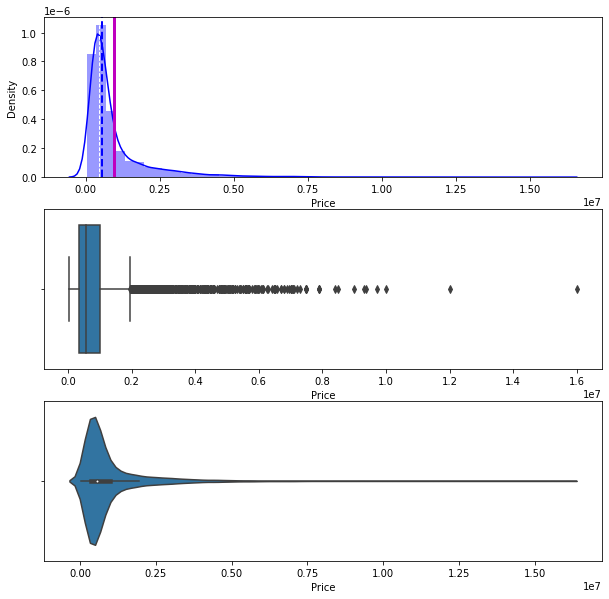

In [71]:
#View the distribution of the Price variable
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.distplot(usedcars_data.Price,color="blue");
plt.axvline(usedcars_data["Price"].mean(),color='m',linewidth=3)# draw a line indicating mean
plt.axvline(usedcars_data["Price"].median(),color='b',linestyle='dashed',linewidth=2)# draw a line indicating median
plt.axvline(usedcars_data["Price"].mode()[0],color='w',linestyle='dashed',linewidth=1)# draw a line indicating mode
plt.subplot(3,1,2)
sns.boxplot(usedcars_data.Price);
plt.subplot(3,1,3)
sns.violinplot(usedcars_data.Price);

In [72]:
print(usedcars_data.Price.describe(percentiles = [0.25,0.50,0.75,0.85,0.90,1]))

count    6.019000e+03
mean     9.479468e+05
std      1.118792e+06
min      4.400000e+04
25%      3.500000e+05
50%      5.640000e+05
75%      9.950000e+05
85%      1.650000e+06
90%      2.250000e+06
100%     1.600000e+07
max      1.600000e+07
Name: Price, dtype: float64


Observations:
- The Price variable ranges from 44000(44 Thousands) to 1.6e+07(1 crore 60 Lakhs)
- The Price variable is highly right skewed,, indicating that the most prices in the dataset are low(below 9 Lakhs).
- There is a significant difference between the mean and the median of the price distribution.
- We can see that there are lot of outliers to the right.This indicates that there are more highly priced cars in the data.
- The median value is 560000 and mean value is around 940000
- The data points are far spread out from the mean, which indicates a high variance in the car prices.(75% of the prices are below 995,000, whereas the remaining 25% are above that)

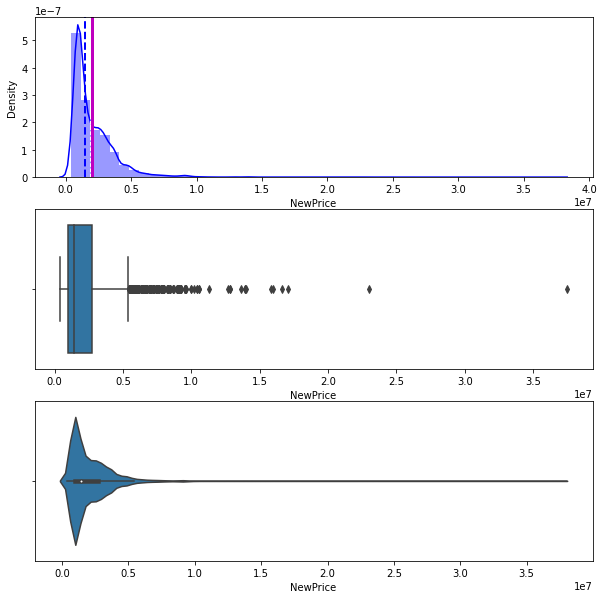

In [73]:
#View the distribution of the NewPrice variable
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.distplot(usedcars_data.NewPrice,color="blue");
plt.axvline(usedcars_data["NewPrice"].mean(),color='m',linewidth=3)# draw a line indicating mean
plt.axvline(usedcars_data["NewPrice"].median(),color='b',linestyle='dashed',linewidth=2)# draw a line indicating median
plt.axvline(usedcars_data["NewPrice"].mode()[0],color='w',linestyle='dashed',linewidth=1)# draw a line indicating mode
plt.subplot(3,1,2)
sns.boxplot(usedcars_data.NewPrice);
plt.subplot(3,1,3)
sns.violinplot(usedcars_data.NewPrice);

Observations:
- The New Price (refering to New Car Price) variable ranges from 490000 to 8.568972e+07
- The NewPrice variable is highly right skewed.
- We can see that there are lot of outliers to the right.
- The median value is 1.249430e+06 and mean value is around 1.856606e+06

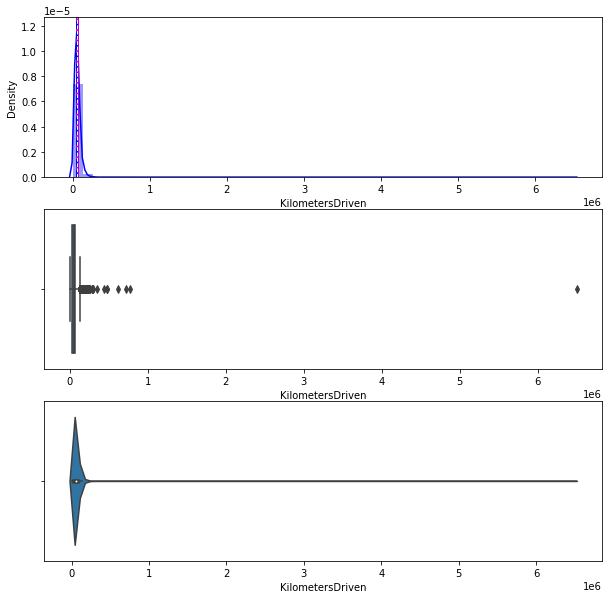

In [74]:
#View the distribution of the KilometersDriven variable
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.distplot(usedcars_data.KilometersDriven,color="blue");
plt.axvline(usedcars_data["KilometersDriven"].mean(),color='m',linewidth=3)# draw a line indicating mean
plt.axvline(usedcars_data["KilometersDriven"].median(),color='b',linestyle='dashed',linewidth=2)# draw a line indicating median
plt.axvline(usedcars_data["KilometersDriven"].mode()[0],color='w',linestyle='dashed',linewidth=1)# draw a line indicating mode
plt.subplot(3,1,2)
sns.boxplot(usedcars_data.KilometersDriven);
plt.subplot(3,1,3)
sns.violinplot(usedcars_data.KilometersDriven);

Observations:

- The Kilometers Driven variable ranges from 171 to 6.5e+06(6500000) Kilometers
- The variable is highly right skewed.
- We can see some outliers to the right.
- The median value is 53416km and mean value is around 58699.1

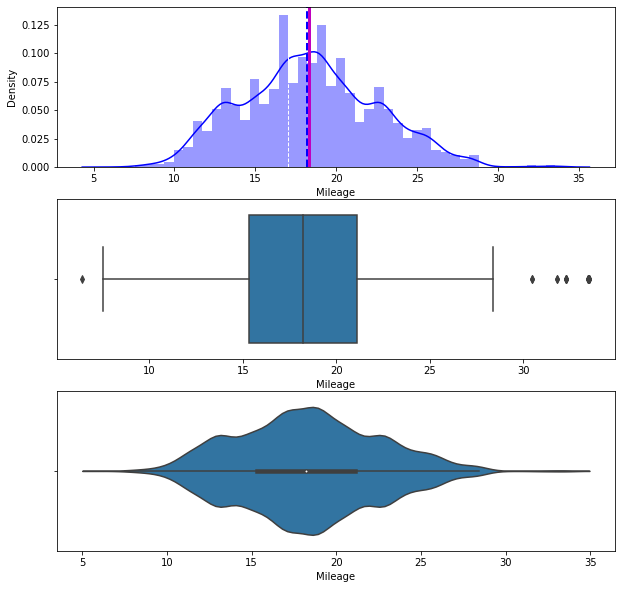

In [75]:
#View the distribution of the Mileage variable
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.distplot(usedcars_data.Mileage,color="blue");
plt.axvline(usedcars_data["Mileage"].mean(),color='m',linewidth=3)# draw a line indicating mean
plt.axvline(usedcars_data["Mileage"].median(),color='b',linestyle='dashed',linewidth=2)# draw a line indicating median
plt.axvline(usedcars_data["Mileage"].mode()[0],color='w',linestyle='dashed',linewidth=1)# draw a line indicating mode
plt.subplot(3,1,2)
sns.boxplot(usedcars_data.Mileage);
plt.subplot(3,1,3)
sns.violinplot(usedcars_data.Mileage);

Observations:

- The Mileage variable ranges from 5 miles per gallon to 33.54 mpg.
- We can see some outliers both to the right and Left. The zero mileage car should have been an data error.It should be fixed while data preparation.
- The median value is 18.82 and mean value is around 18.83 kmpl or km/kg based on the fuel type

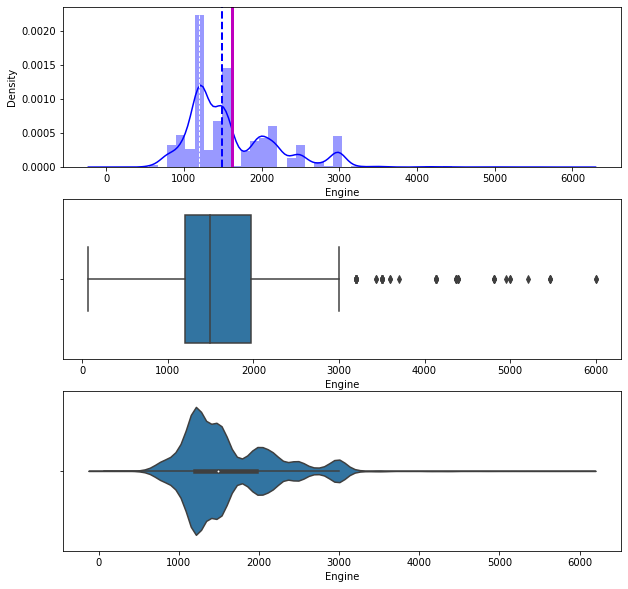

In [76]:
#View the distribution of the Engine variable
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.distplot(usedcars_data.Engine,color="blue");
plt.axvline(usedcars_data["Engine"].mean(),color='m',linewidth=3)# draw a line indicating mean
plt.axvline(usedcars_data["Engine"].median(),color='b',linestyle='dashed',linewidth=2)# draw a line indicating median
plt.axvline(usedcars_data["Engine"].mode()[0],color='w',linestyle='dashed',linewidth=1)# draw a line indicating mode
plt.subplot(3,1,2)
sns.boxplot(usedcars_data.Engine);
plt.subplot(3,1,3)
sns.violinplot(usedcars_data.Engine);

Observations:
- The Engine(displacement volume or size of the engine measured in cubic centimeters/cc) variable ranges from 72 to 5998
- The variable is highly right skewed. This shows that there are lot of cars with high engine capacity.
- We can see some outliers to the right.
- The median value is 1493 and mean value is 1616cc.

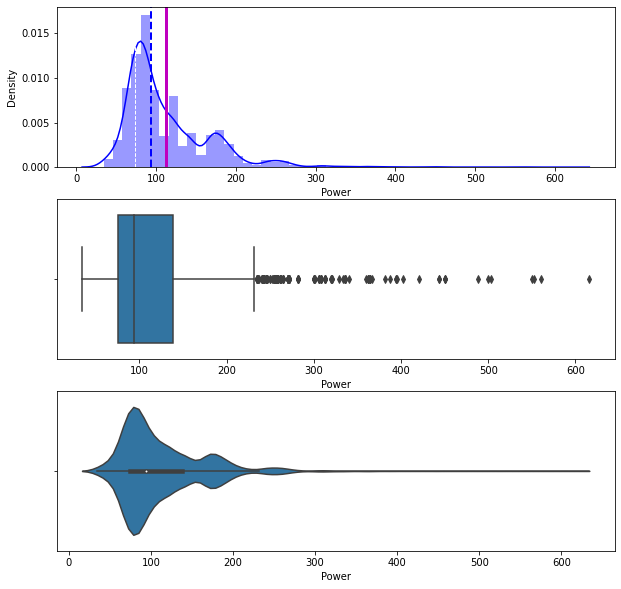

In [77]:
#View the distribution of the Power variable
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
sns.distplot(usedcars_data.Power,color="blue");
plt.axvline(usedcars_data["Power"].mean(),color='m',linewidth=3)# draw a line indicating mean
plt.axvline(usedcars_data["Power"].median(),color='b',linestyle='dashed',linewidth=2)# draw a line indicating median
plt.axvline(usedcars_data["Power"].mode()[0],color='w',linestyle='dashed',linewidth=1)# draw a line indicating mode
plt.subplot(3,1,2)
sns.boxplot(usedcars_data.Power);
plt.subplot(3,1,3)
sns.violinplot(usedcars_data.Power);

Observations:
- The Power(Engine power measured in bhp) variable ranges from 34.2 to 616 bhp
- The variable is highly right skewed.
- We can see some outliers to the right.
- The median value is 94 and mean value is 112.7

In [78]:
usedcars_data.dtypes

Year                     float64
KilometersDriven         float64
Mileage                  float64
Engine                   float64
Power                    float64
Seats                    float64
NewPrice                 float64
Fuel_Diesel              float64
Fuel_Electric            float64
Fuel_LPG                 float64
Fuel_Petrol              float64
Transmission_Manual      float64
Owner_Fourth & Above     float64
Owner_Second             float64
Owner_Third              float64
Region_North             float64
Region_South             float64
Region_West              float64
Location                category
Fuel_Type               category
Transmission            category
Owner_Type              category
Loc_Region              category
Car_make                category
Price                    float64
dtype: object

## View the plots for categorical variables

In [79]:
# Function to create barplots that indicate percentage for each category.
def bar_perc(plot, feature):
    '''
    plot
    feature: 1-d categorical feature array
    '''
    total = len(feature) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        ax.annotate(percentage, (x, y), size = 12) # annotate the percantage

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]),
 [Text(0, 0, 'AMBASSADOR'),
  Text(1, 0, 'AUDI'),
  Text(2, 0, 'BENTLEY'),
  Text(3, 0, 'BMW'),
  Text(4, 0, 'CHEVROLET'),
  Text(5, 0, 'DATSUN'),
  Text(6, 0, 'FIAT'),
  Text(7, 0, 'FORCE-ONE'),
  Text(8, 0, 'FORD'),
  Text(9, 0, 'HINDUSTAN-MOTORS'),
  Text(10, 0, 'HONDA'),
  Text(11, 0, 'HYUNDAI'),
  Text(12, 0, 'ISUZU'),
  Text(13, 0, 'JAGUAR'),
  Text(14, 0, 'JEEP'),
  Text(15, 0, 'LAMBORGHINI'),
  Text(16, 0, 'LAND-ROVER'),
  Text(17, 0, 'MAHINDRA'),
  Text(18, 0, 'MARUTI'),
  Text(19, 0, 'MERCEDES-BENZ'),
  Text(20, 0, 'MINI-COOPER'),
  Text(21, 0, 'MITSUBISHI'),
  Text(22, 0, 'NISSAN'),
  Text(23, 0, 'OPELCORSA'),
  Text(24, 0, 'PORSCHE'),
  Text(25, 0, 'RENAULT'),
  Text(26, 0, 'SKODA'),
  Text(27, 0, 'SMART-FORTWO'),
  Text(28, 0, 'TATA'),
  Text(29, 0, 'TOYOTA'),
  Text(30, 0, 'VOLKSWAGEN'),
  Text(31, 0, 'VOLVO')])

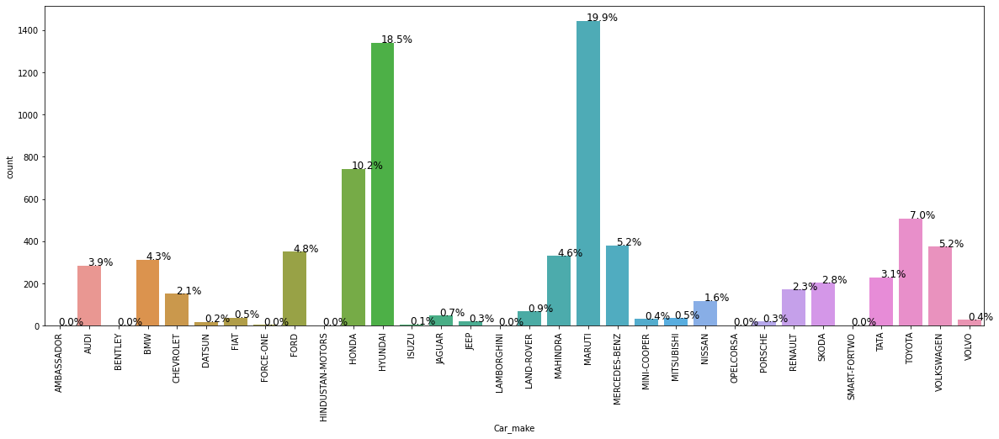

In [80]:
#View the countplot on Car make 
plt.figure(figsize=(20,7))
ax = sns.countplot(usedcars_data['Car_make'])
bar_perc(ax,usedcars_data['Car_make'])
plt.xticks( rotation=90)

Observations:
- From above visualization, we see that Maruti and Hyundai were sold more compared to other cars, followed by Honda,Toyota and other cars.

In [81]:
#Converting the Seats variable to interger and then to type category to view the countplot
usedcars_data["Seats"]=usedcars_data["Seats"].astype("int")
usedcars_data["Seats"]=usedcars_data["Seats"].astype("category")

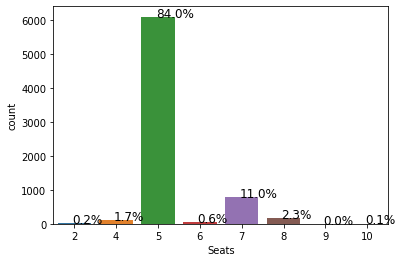

In [82]:
#View the countplot on Seats 
ax = sns.countplot(usedcars_data['Seats'])
bar_perc(ax,usedcars_data['Seats'])

Observations:
- Five seater cars were sold more, followed by 7 setaer cars,8 seater cars, 4 seater cars, 6 seater cars and the rest.
- Five seater cars occupies 83.7% share in the car sales market.

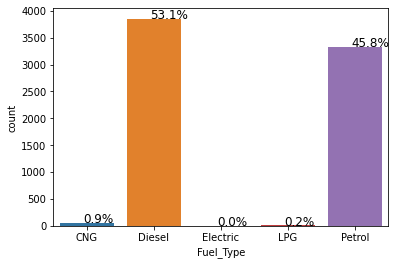

In [83]:
#View the countplot on Fuel Type 
ax = sns.countplot(usedcars_data['Fuel_Type'])
bar_perc(ax,usedcars_data['Fuel_Type'])

Observations:
- There are more Diesel cars than cars with any other fuel type.
- Diesel and Petrol cars have more demand, which is understandable considering the availability of the gas charging stations. 
- Electric fuel type cars sales are shown as 0.0%. As charging stations become more prevalent, electric cars may replace the ICE vehicles. 

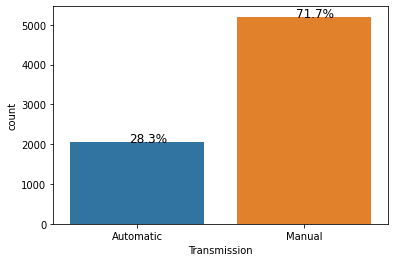

In [84]:
#View the countplot on Transmission 
ax = sns.countplot(usedcars_data['Transmission'])
bar_perc(ax,usedcars_data['Transmission'])

Observations:
- Ther are more Manual cars compared to Automatic.

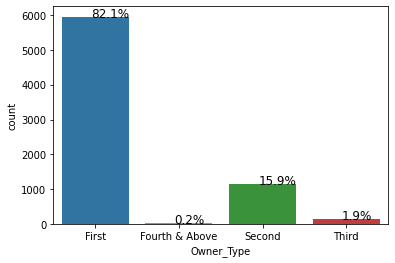

In [85]:
#View the countplot on Owner Type 
ax = sns.countplot(usedcars_data['Owner_Type'])
bar_perc(ax,usedcars_data['Owner_Type'])

Observations:
- First hand cars or Owner type First were sold more with 82.1% compared to second,Third owner cars and the rest.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Ahmedabad'),
  Text(1, 0, 'Bangalore'),
  Text(2, 0, 'Chennai'),
  Text(3, 0, 'Coimbatore'),
  Text(4, 0, 'Delhi'),
  Text(5, 0, 'Hyderabad'),
  Text(6, 0, 'Jaipur'),
  Text(7, 0, 'Kochi'),
  Text(8, 0, 'Kolkata'),
  Text(9, 0, 'Mumbai'),
  Text(10, 0, 'Pune')])

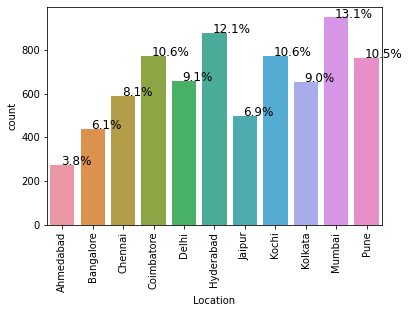

In [86]:
#View the countplot on Location 
ax = sns.countplot(usedcars_data['Location'])
bar_perc(ax,usedcars_data['Location'])
plt.xticks(rotation=90)

Observations:
- There are more car sales in Mumbai, followed by Hyderabad,Kochi,coimbatore,Pune and the rest.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]),
 [Text(0, 0, 'AMBASSADOR'),
  Text(1, 0, 'AUDI'),
  Text(2, 0, 'BENTLEY'),
  Text(3, 0, 'BMW'),
  Text(4, 0, 'CHEVROLET'),
  Text(5, 0, 'DATSUN'),
  Text(6, 0, 'FIAT'),
  Text(7, 0, 'FORCE-ONE'),
  Text(8, 0, 'FORD'),
  Text(9, 0, 'HINDUSTAN-MOTORS'),
  Text(10, 0, 'HONDA'),
  Text(11, 0, 'HYUNDAI'),
  Text(12, 0, 'ISUZU'),
  Text(13, 0, 'JAGUAR'),
  Text(14, 0, 'JEEP'),
  Text(15, 0, 'LAMBORGHINI'),
  Text(16, 0, 'LAND-ROVER'),
  Text(17, 0, 'MAHINDRA'),
  Text(18, 0, 'MARUTI'),
  Text(19, 0, 'MERCEDES-BENZ'),
  Text(20, 0, 'MINI-COOPER'),
  Text(21, 0, 'MITSUBISHI'),
  Text(22, 0, 'NISSAN'),
  Text(23, 0, 'OPELCORSA'),
  Text(24, 0, 'PORSCHE'),
  Text(25, 0, 'RENAULT'),
  Text(26, 0, 'SKODA'),
  Text(27, 0, 'SMART-FORTWO'),
  Text(28, 0, 'TATA'),
  Text(29, 0, 'TOYOTA'),
  Text(30, 0, 'VOLKSWAGEN'),
  Text(31, 0, 'VOLVO')])

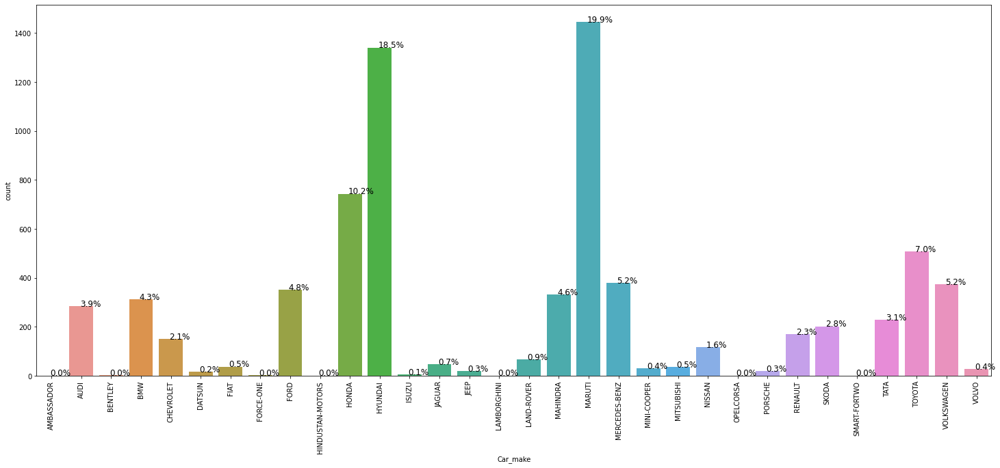

In [87]:
#View the countplot on Location 
plt.figure(figsize=(25,10))
ax = sns.countplot(usedcars_data['Car_make'])
bar_perc(ax,usedcars_data['Car_make'])
plt.xticks(rotation=90)

Observations:
- Maruti (19.9%) and Hyundai (18.5%) are the top 2 selling brands.

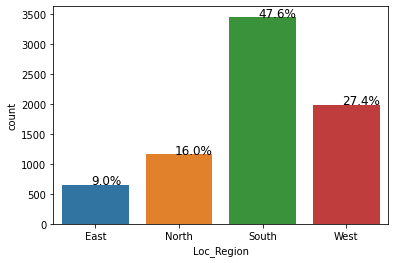

In [88]:
#View the countplot on Region 
ax = sns.countplot(usedcars_data['Loc_Region'])
bar_perc(ax,usedcars_data['Loc_Region'])

Observations:
- Thereare more car sales in South region compared to other regions.

## Distribution of each numerical variable.

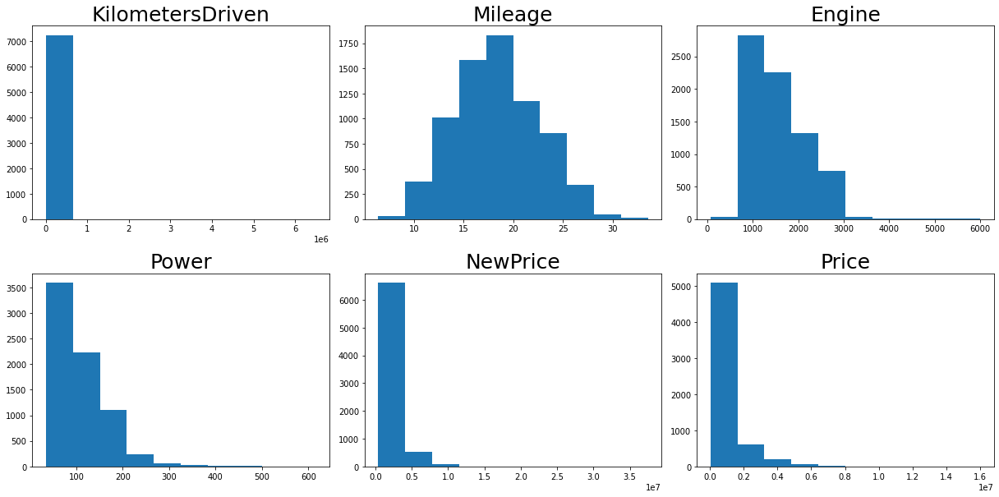

In [89]:
# lets plot histogram of all plots
from scipy.stats import norm
numeric_columns=['KilometersDriven','Mileage','Engine','Power','NewPrice','Price']
plt.figure(figsize=(17,75))

for i in range(len(numeric_columns)):
    plt.subplot(18,3,i+1)
    plt.hist(usedcars_data[numeric_columns[i]])
    plt.tight_layout()
    plt.title(numeric_columns[i],fontsize=25)
    

plt.show()

Mileage variable alone shows a normal distribution.

# Bivariate Analysis
Plot bivariate charts between variables to understand their interaction with each other.

## Corrrelation

In [90]:
usedcars_data[usedcars_data.columns[:]].corr()["Price"][:]

Year                    0.305327
KilometersDriven       -0.011493
Mileage                -0.335078
Engine                  0.657034
Power                   0.771788
NewPrice                0.663362
Fuel_Diesel             0.320645
Fuel_Electric           0.005534
Fuel_LPG               -0.025499
Fuel_Petrol            -0.309363
Transmission_Manual    -0.586025
Owner_Fourth & Above   -0.021445
Owner_Second           -0.073552
Owner_Third            -0.055297
Region_North           -0.056190
Region_South            0.160932
Region_West            -0.066132
Price                   1.000000
Name: Price, dtype: float64

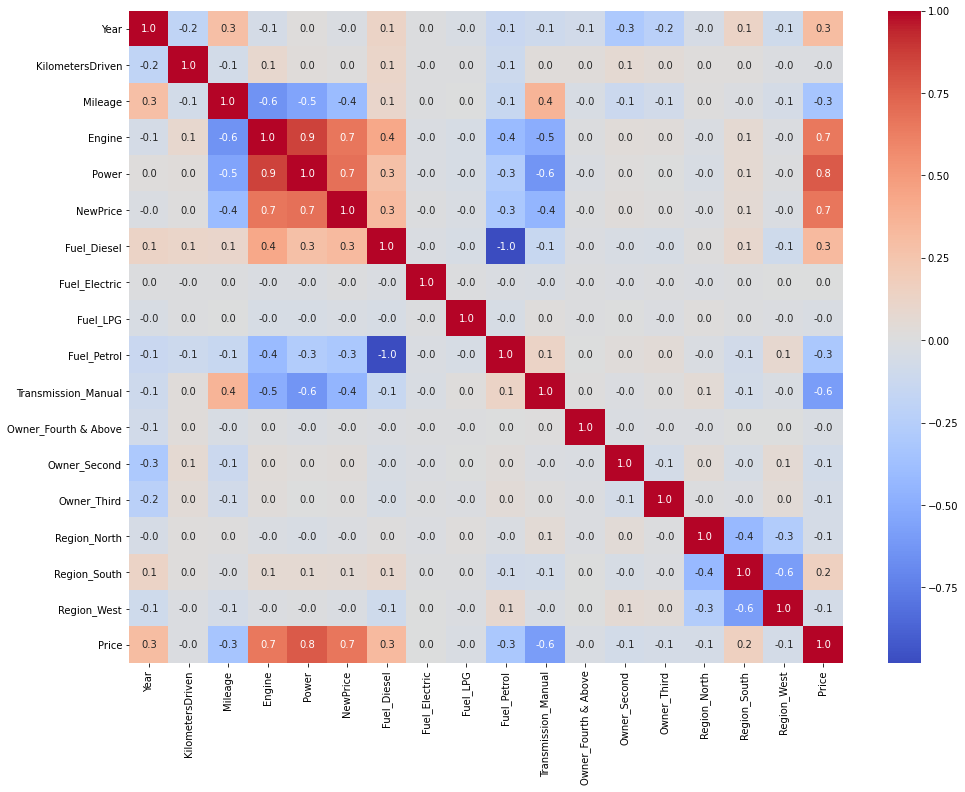

In [91]:
corr=usedcars_data.corr()
plt.figure(figsize=(16,12))
sns.heatmap(corr, annot=True,cmap='coolwarm',
        fmt=".1f",
        xticklabels=corr.columns,
        yticklabels=corr.columns);

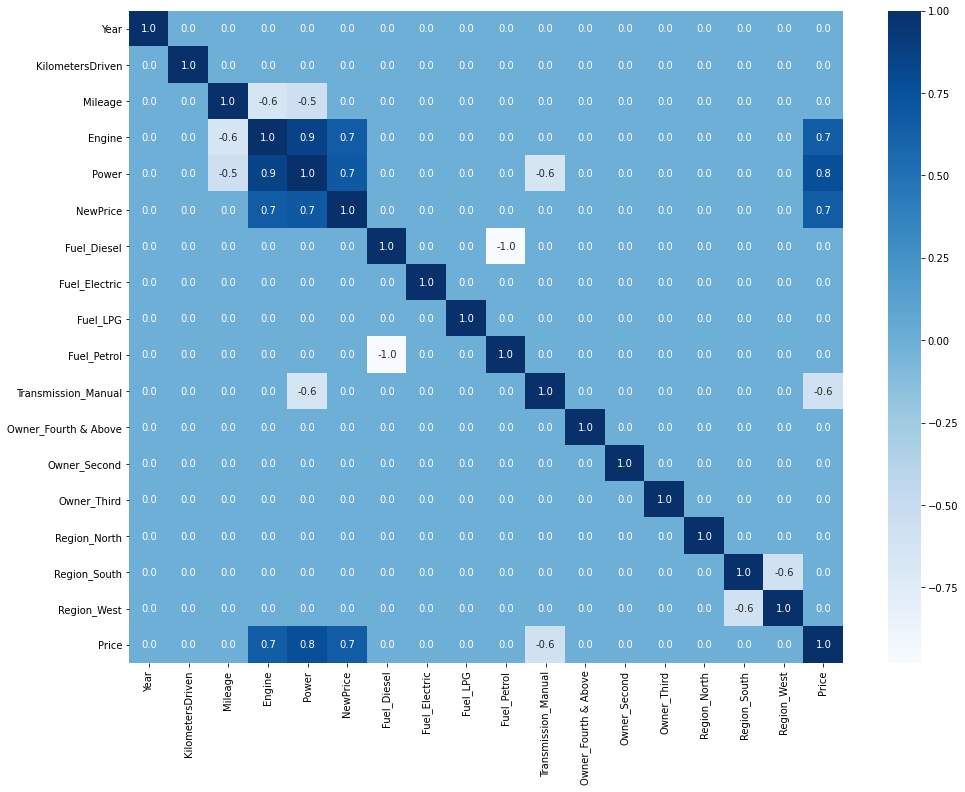

In [92]:
# View the heatmap by filtering out the correlations less than 0.5
corr=usedcars_data.corr()
corr[np.abs(corr)<0.5]=0
#matrix = np.triu(usedcars_data_undummify.corr())
plt.figure(figsize=(16,12))
sns.heatmap(corr, annot=True,cmap='Blues',
        fmt=".1f",
        xticklabels=corr.columns,
        yticklabels=corr.columns
        #,mask=matrix
           );

Observations:
- Strong correlation(0.5-0.75) ; High Correlation(0.75-1.0)
- Price Variable is strongly correlated with Price,Power and Engine variables and negatively correlated with Manual Transmission. Automatic transmission is usually more expensive than manual transmission. 
- Engine variable is highly correlated with power and strongly correlated with price and negatively correlated with Mileage.Either can of them(power & Engine) can be dropped while creating the model.
- Power is strongly correlated with price and negatively correlated with manual transmission and power.
- Mileage is strongly negatively correlated with engine and power. Bigger engines are used in larger vehicles and their mileage is usually smaller than vehicles with smaller engines.
- Price and Newprice are highly correlated.

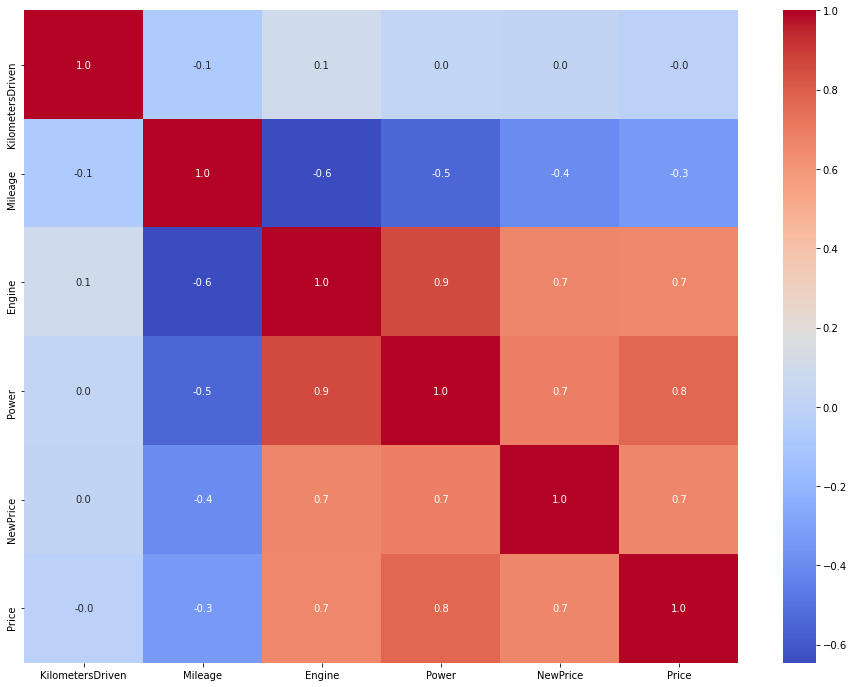

In [93]:
corr=usedcars_data[['KilometersDriven', 'Mileage', 'Engine', 'Power', 'NewPrice','Price']].corr()   
plt.figure(figsize=(16,12))
sns.heatmap(corr, annot=True,cmap='coolwarm',
        fmt=".1f",
        xticklabels=corr.columns,
        yticklabels=corr.columns);

## Pairplot

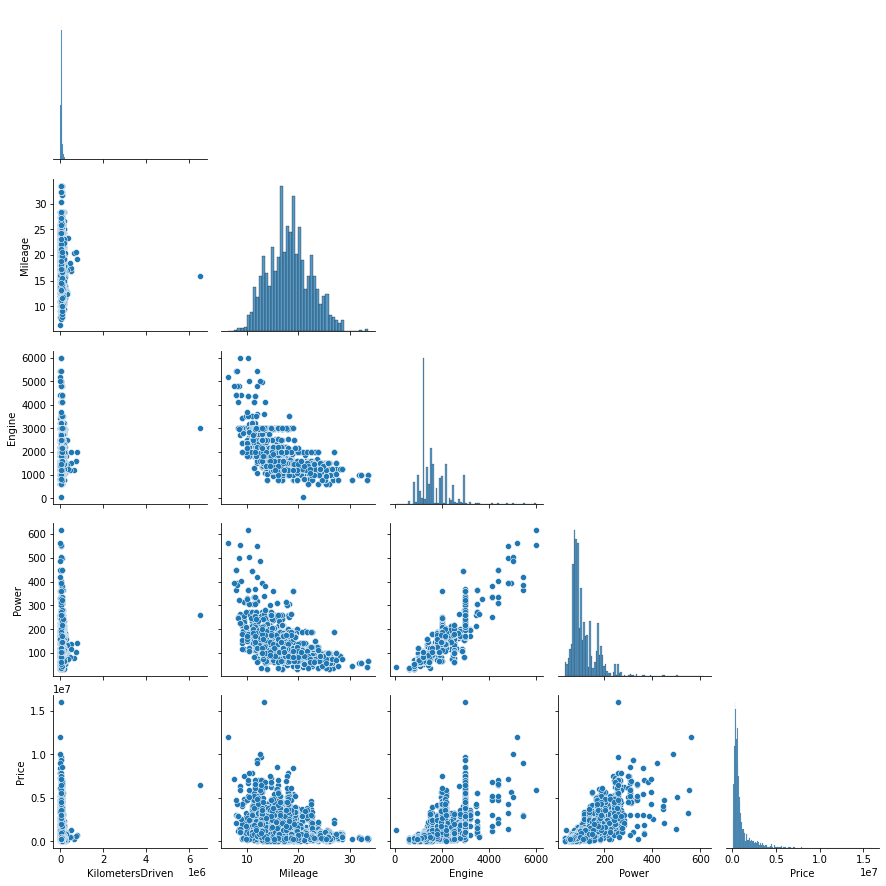

In [94]:
sns.pairplot(usedcars_data[['KilometersDriven', 'Mileage', 'Engine','Power','Price']], corner=True);

Observations:

We see the same observations as above.
- Engine is highly positively correlated with Power.
- Engine and power are negatively correlated with Mileage.
- Price is positively correlated with Power and Engine.
- We see an outlier at 65lakhs miles for kilometersdriven. That should be taken care of.

### Price vs KilometersDriven

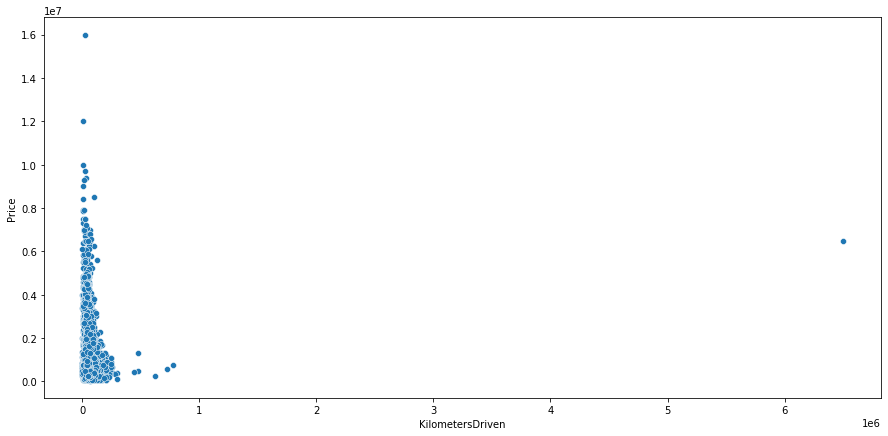

In [95]:
plt.figure(figsize=(15,7))
sns.scatterplot(y='Price', x='KilometersDriven',data=usedcars_data);

Observations:
- From heatmap, there is no correlation between Kilometers and Price variable.
- As lowest kilometers driven, the price variable seems to vary in all ranges from low to high. 
- We notice an outlier at 6500000 kilometers. It could be because of a human error and needs to be addressed.

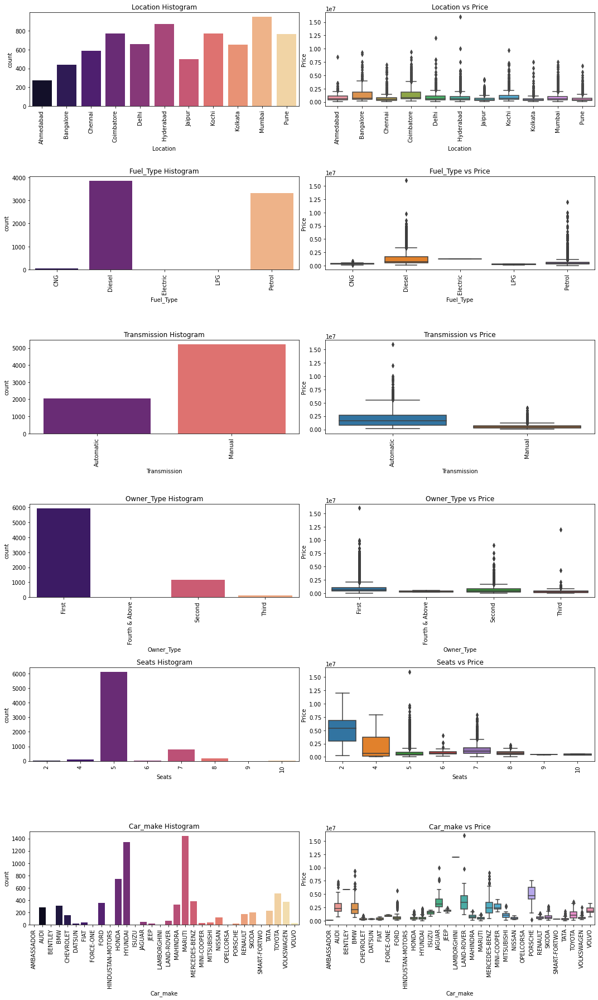

In [96]:
def plot_count(x,fig):
    plt.subplot(6,2,fig)
    plt.title(x+' Histogram')
    plt.xticks(rotation=90)
    sns.countplot(usedcars_data[x],palette=("magma"))
    plt.subplot(6,2,(fig+1))
    plt.title(x+' vs Price')
    plt.xticks(rotation=90)
    sns.boxplot(x=usedcars_data[x], y=usedcars_data.Price)
    
plt.figure(figsize=(15,25))
plot_count('Location', 1)
plot_count('Fuel_Type', 3)
plot_count('Transmission', 5)
plot_count('Owner_Type', 7)
plot_count('Seats', 9)
plot_count('Car_make', 11)

plt.tight_layout()

Observations:
- The car sales are highest in Mumbai followed by Hyderabad and the rest of the locations.
- The median used car price is high in Coimbatore. It could be because there are more highly expensive cars in Coimbatore compared to other locations.
- There are more Diesel cars than cars with any other fuel type.
- Diesel and Petrol cars have more demand, which is understandable considering the prevalence of the gas stations. 
- Electric car sales are negligible and shown as 0.0%. As charging stations become more prevalent, electric cars may replace the ICE vehicles.
- The median price of Diesel cars appears to be higher than petrol and other cars.
- Manual Cars are widely used. Automatic cars seems to be expensive compared to Manual cars.
- Cars sold by first owner (owner type one) account for 82.1% of total used cars sold. These are followed by cars sold by second owners and third owners. 
- The average price of First owner type cars are higher than the rest.
- 5 seater cars are most common. 2 Seater cars are highly priced compared to any numbered seater cars.
- Maruti, Hyundai cars are most seen. Bentley and Lamborghini brand cars are highly priced.

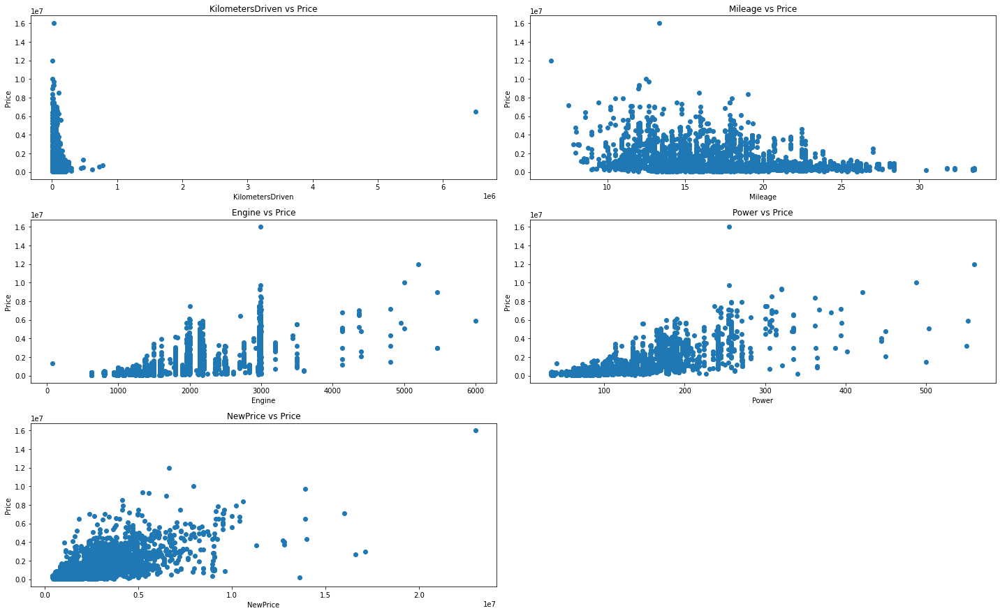

In [97]:
def scatter(x,fig):
    plt.subplot(5,2,fig)
    plt.scatter(usedcars_data[x],usedcars_data['Price'])
    plt.title(x+' vs Price')
    plt.ylabel('Price')
    plt.xlabel(x)

plt.figure(figsize=(20,20))

scatter('KilometersDriven', 1)
scatter('Mileage', 2)
scatter('Engine', 3)
scatter('Power', 4)
scatter('NewPrice', 5)

plt.tight_layout()

Observations:
- Engine and Power are positively correlated with Price. 
- As Engine capacity increases, Price increases. Similarly as power increases, Price increases.
- New_price is also positively correlated with Price. As New car price is high, Used car price of that vehicle would tend to be high.
- Mileage appears to be negatively correlated with Price. As mileage increases, Price decreases.

<Figure size 1080x1440 with 0 Axes>

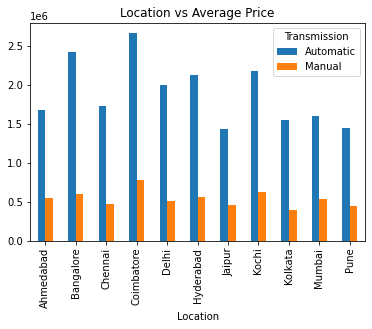

In [98]:
plt.figure(figsize=(15, 20))

df = pd.DataFrame(usedcars_data.groupby(['Location','Transmission'])['Price'].mean().unstack(fill_value=0))
df.plot.bar();
plt.title('Location vs Average Price')
plt.show()

Observations:
- The average price of automatic cars in coimbatore seems to be the highest,followed by Bangalore,Kochi, Hyderabad and the rest. It appears that there are more highly expensive cars used in Coimbatore.

### Price vs Power

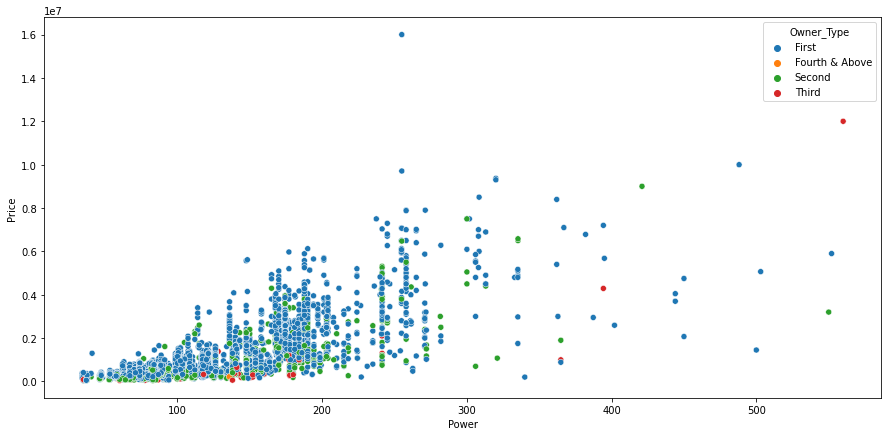

In [99]:
# Lets look visualize the relationship between Price and Power
plt.figure(figsize=(15,7))
sns.scatterplot(y='Price', x='Power', hue='Owner_Type', data=usedcars_data);

Observations:
- As power increases, price increases.
- Most of the cars sold are first owner type and they lie in all the ranges of power.
- Third owner cars seems to be in the lower range of the power.

### Price vs Engine

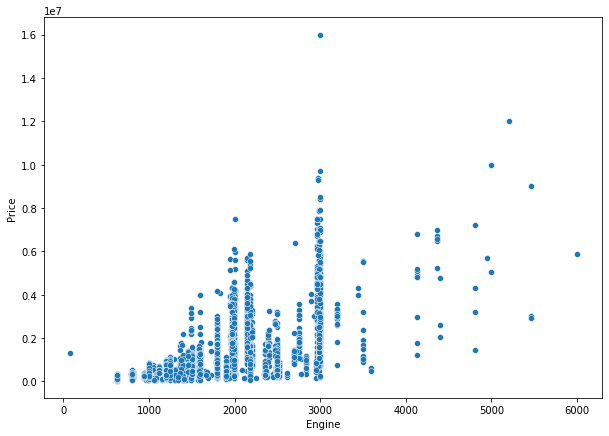

In [100]:
plt.figure(figsize=(10,7))
sns.scatterplot(y='Price', x='Engine',data=usedcars_data);

Observations:
- As Engine capacity increases, Price increases.. They both are positively correlated.

### Price vs Power vs Transmission

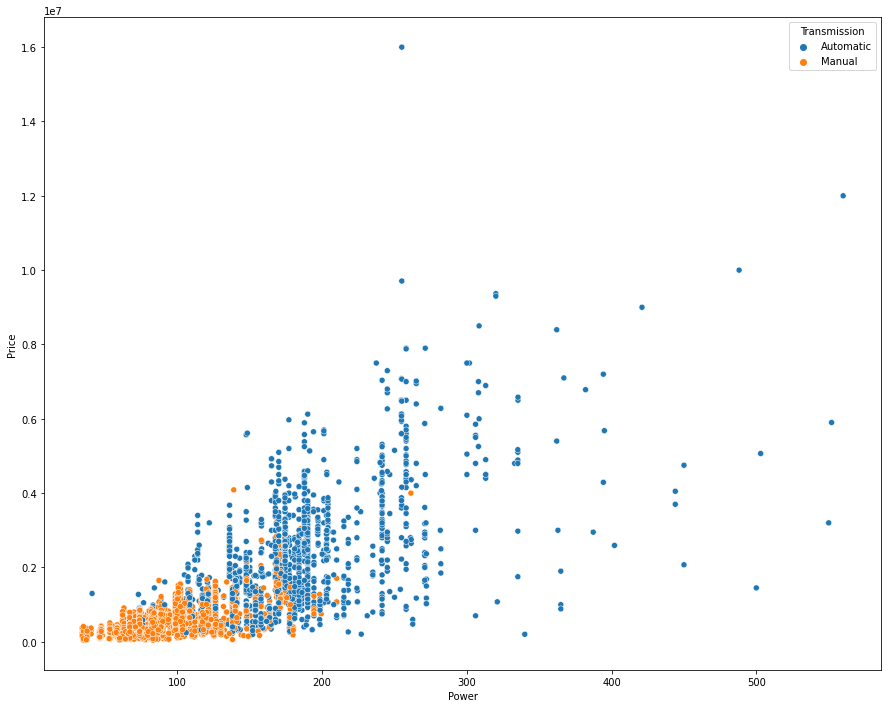

In [101]:
# Lets look visualize the relationship between Price and Power
plt.figure(figsize=(15,12))
sns.scatterplot(y='Price', x='Power', hue='Transmission', data=usedcars_data);

Observations:
- There are more automatic cars with higher power than manual transmission cars. As power goes up, customers are prefering automatic transmission.
- Most of the Manual cars are at lower range of the power except one outlier, which needs to be looked into.

### Price vs Power vs Seats

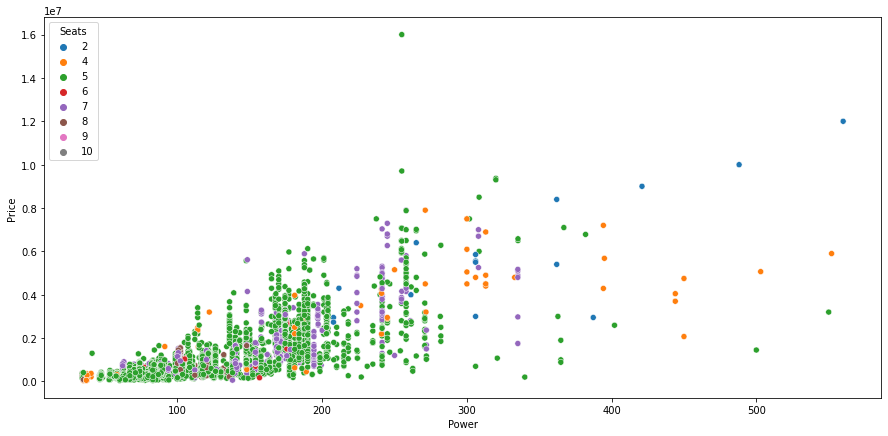

In [102]:
# Lets look visualize the relationship between Price and Power
plt.figure(figsize=(15,7))
sns.scatterplot(y='Price', x='Power', hue='Seats', data=usedcars_data);

Observation:
- There are 5 seater cars in all the power ranges.
- Most of the 2 seater cars and 4 Seater cars are with higher power and are highly priced.

### Seats vs Price

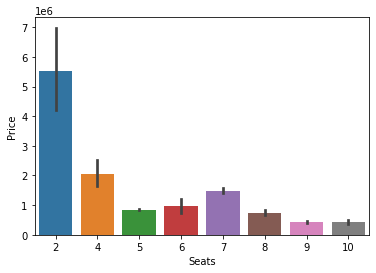

In [103]:
sns.barplot(y='Price', x='Seats',data=usedcars_data);

Observations:
- The used car price of 2 Seater cars seems to be on the higher end compared to other seater cars. 

### Fuel_Type vs Price

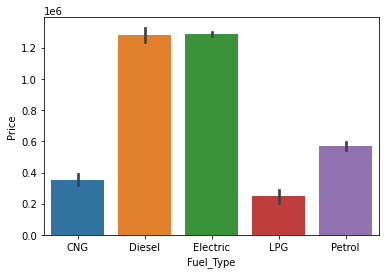

In [104]:
sns.barplot(y='Price', x='Fuel_Type',data=usedcars_data);

### Transmission vs Price

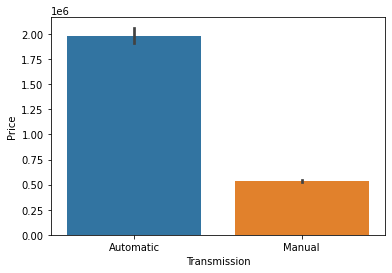

In [105]:
sns.barplot(y='Price', x='Transmission',data=usedcars_data);

Observations:
- Automatic cars seems to be expensive compared to Manual cars.

### Location vs Fuel Type

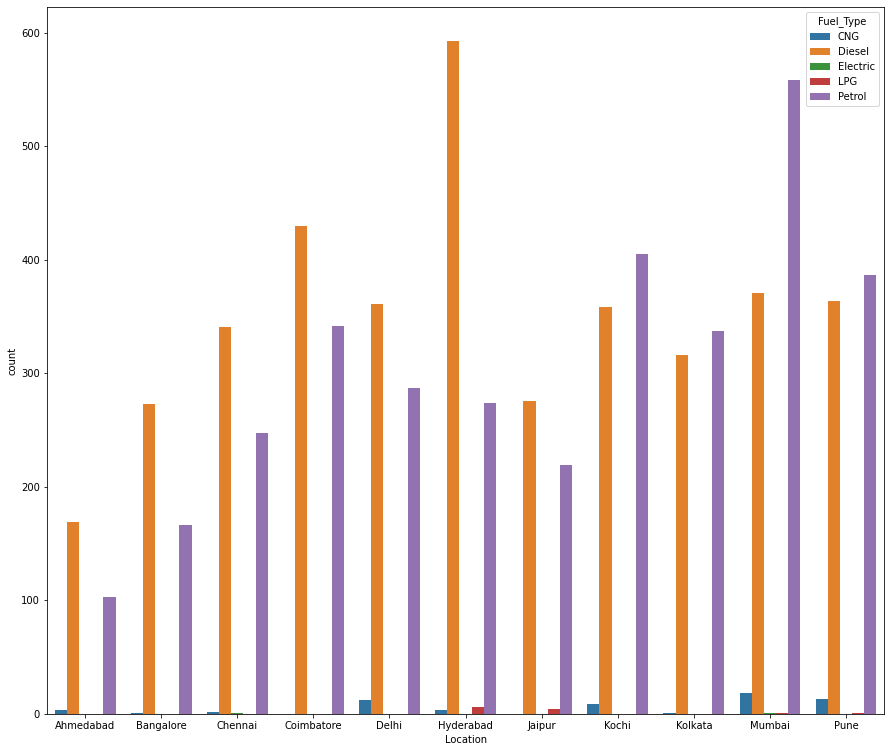

In [106]:
plt.figure(figsize=(15,13))
sns.countplot(x='Location',hue='Fuel_Type',data=usedcars_data);

Observations:
- We notice that there are more diesel car sales in Hyderabad and Petrol car sales in Mumbai.
- In most of the Locations, Diesel cars are sold more compared to other Fuel type cars.
- In Mumbai, Kochi,Pune and Kolkata, Petrol cars are sold more than Diesel cars and other fuel type cars.
- CNG fuel type cars have very few sales and appears to have sales in Mumbai,Pune,Delhi,Hyderabad and Kochi.
- LPG cars seems to be used in Hyderabad and Jaipur itself.

### Price vs New Price vs Owner Type

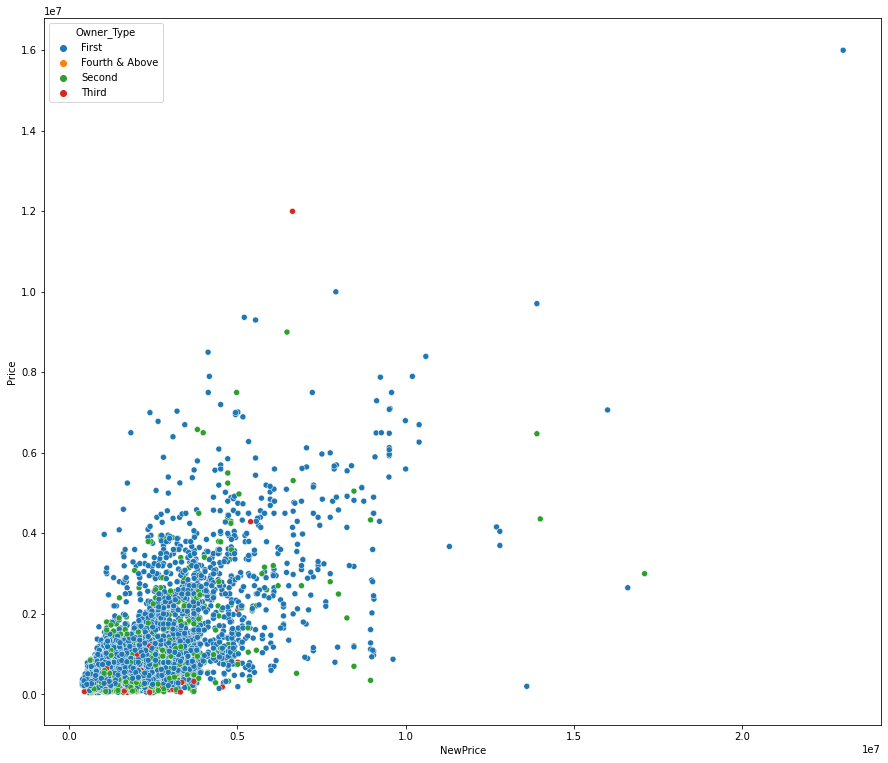

In [107]:
plt.figure(figsize=(15,13))
sns.scatterplot(y='Price', x='NewPrice', hue='Owner_Type', data=usedcars_data);

Observations:
- Price and NewPrice are positively correlated. Intuitively, as newprice of a car is increases,then its Used car price will also increase.  
- We notice some outliers and they should be taken care of while building the model.
- We see that First ownertype cars are sold more than other owner types. 
- We notice that as NewPrice goes beyond 1 crore, the used car price is decreasing indicating that price is not just dependent on New price but on various other factors.

### Mileage vs Fuel_Type

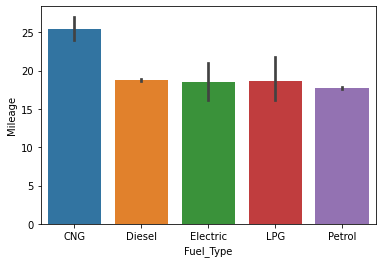

In [108]:

sns.barplot(y='Mileage', x='Fuel_Type', data=usedcars_data);


Observations:
- CNG cars have better fuel economy( are giving more mileage) compared to other fuel type cars.

### New Price vs Fuel_Type

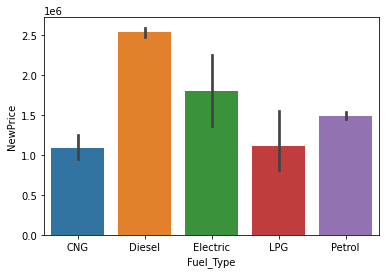

In [109]:

sns.barplot(y='NewPrice', x='Fuel_Type', data=usedcars_data);

Observations:
- The new car price of diesel cars is compatrable to other Fuel type cars.

### Price vs Fuel_Type

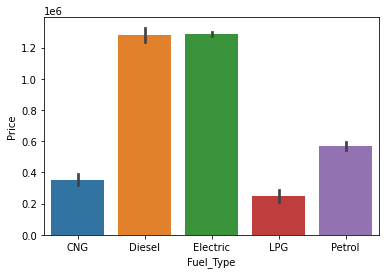

In [110]:

sns.barplot(y='Price', x='Fuel_Type', data=usedcars_data);

Observations:
- The average used car price of diesel and electric cars are higher than other Fuel type cars.

### Price vs NewPrice vs FuelType

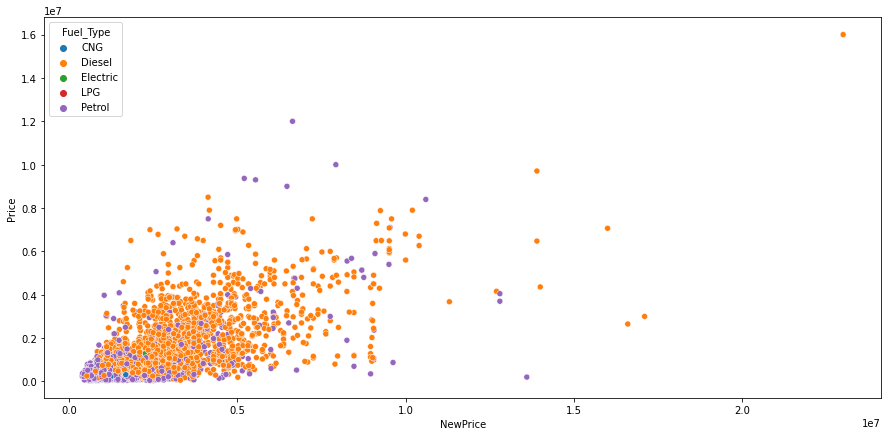

In [111]:
plt.figure(figsize=(15,7))
sns.scatterplot(y='Price', x='NewPrice', hue='Fuel_Type', data=usedcars_data);

Observations:
- We notice lot of diesel cars data points. It shows that there is lot of demand for diesel cars and are widely sold.
- We notice that used cars with petrol as fuel type has lesser resale value compared to Diesel.

### Price vs Mileage

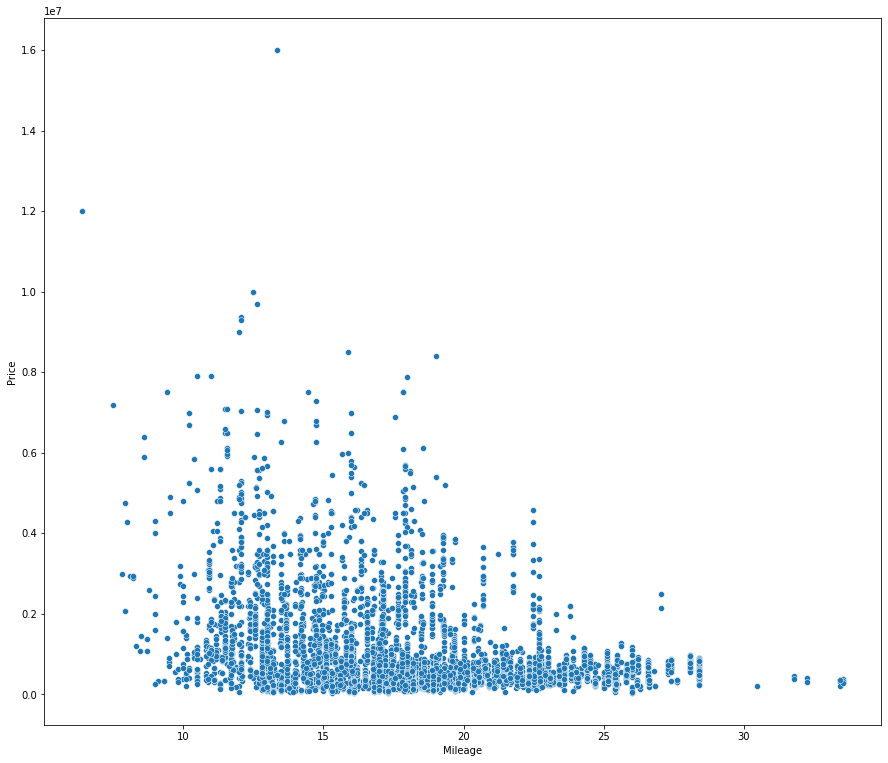

In [112]:
# Lets look visualize the relationship between Price and Mileage
plt.figure(figsize=(15,13))
sns.scatterplot(y='Price', x='Mileage', data=usedcars_data);

Observations:
- The used car price is slightly negatively correlated with mileage, as already noticed in heatmap.
- As mileage increases, the used car price doesnt seem to increase.

### Year vs Price

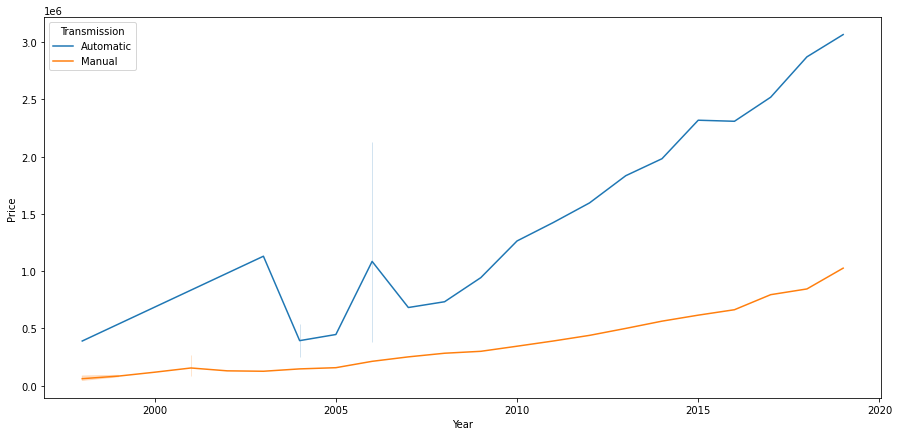

In [113]:
# How does Price vary year by year
plt.figure(figsize=(15,7))
sns.lineplot(x='Year', y='Price',hue="Transmission",
             data=usedcars_data);

Observations:
- The average price of used cars seems to be increasing over the years.

### Year vs Newprice vs Transmission

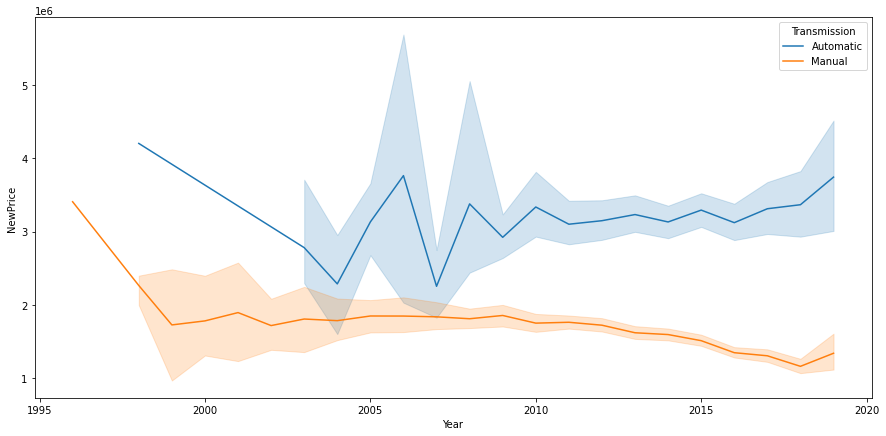

In [114]:
# How does Price vary year by year
plt.figure(figsize=(15,7))
sns.lineplot(x='Year', y='NewPrice',hue="Transmission",
             data=usedcars_data);

Observations:
- The New Car price of Manual cars is slowly decreasing.
- The New Car price for Automatic cars started gradually increasing from 2007.


### Engine vs Power vs Fuel

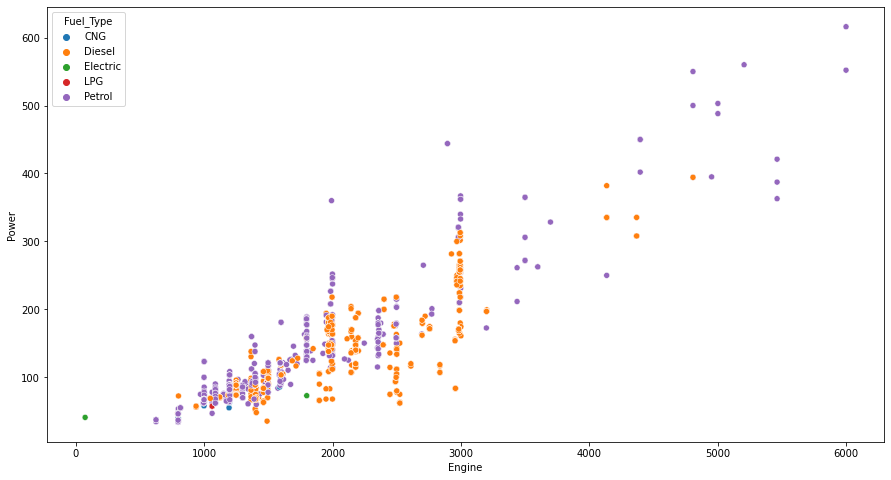

In [115]:
# How does NewPrice vary with Power
plt.figure(figsize=(15,8))
sns.scatterplot(x='Engine', y='Power',hue="Fuel_Type",
             data=usedcars_data);

Observations:
- Engine variable seems to be highly correlated with Power and maybe one of the two variables should be removed for model building

### Engine vs Mileage

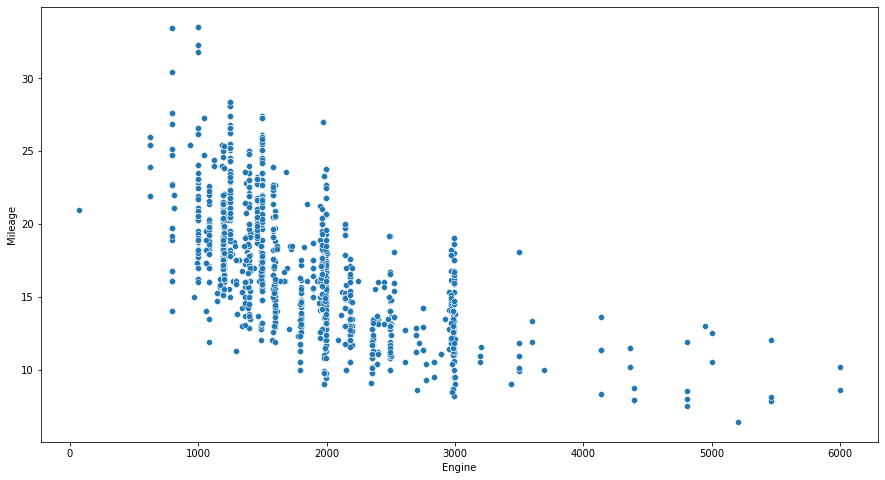

In [116]:
plt.figure(figsize=(15,8))
sns.scatterplot(x='Engine', y='Mileage',
             data=usedcars_data);

Observations:
- We see that as engine volume increases, Mileage decreases. Engine and mileage are negatively correlated as we have already noticed in heatmap.

In [117]:
usedcars_data["Year"]=usedcars_data["Year"].astype("int")
usedcars_data["Year"]=usedcars_data["Year"].astype("category")

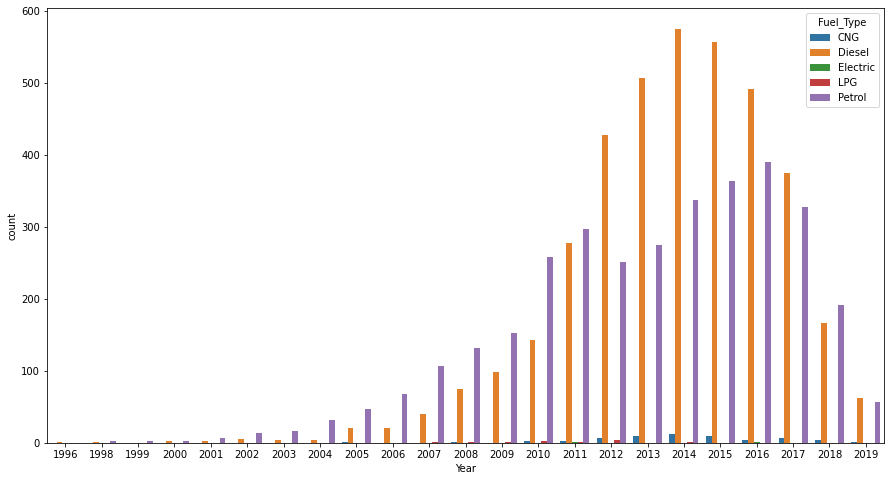

In [118]:
plt.figure(figsize=(15,8))
sns.countplot(x='Year', hue='Fuel_Type',data=usedcars_data);

Observations:
- We notice that Petrol cars had the highest market share until 2011. Diesel cars took the seat at the top since 2012 with 2018 being an exception (when petrol car sales were higher than diesel car sales)


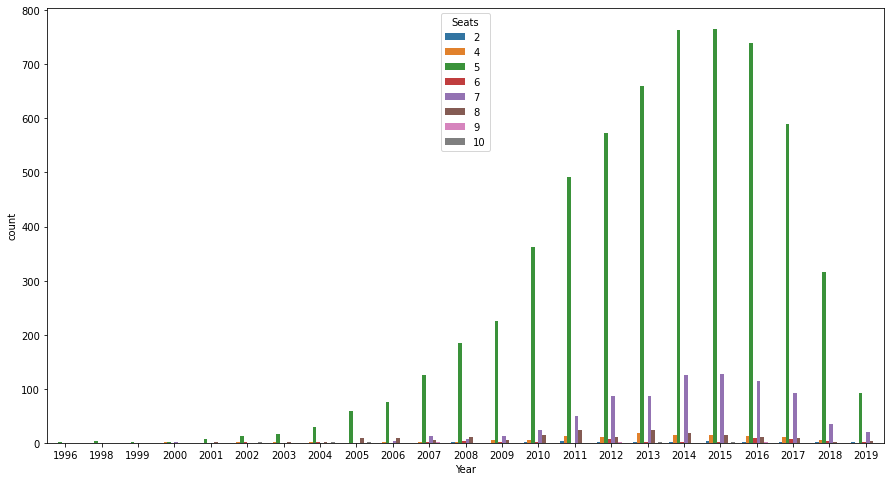

In [119]:
plt.figure(figsize=(15,8))
sns.countplot(x='Year', hue='Seats',data=usedcars_data);

Observations:
- The demand for 5-seater cars was consistently high all through the years


In [120]:
df_usc=usedcars_data.pivot_table(index = 'Car_make',columns ='Year',values ='Price')

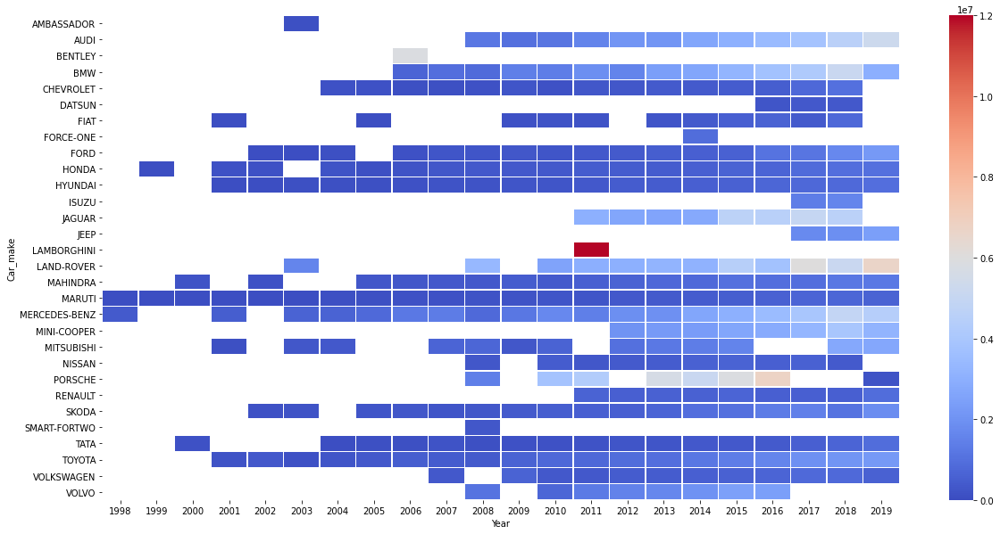

In [121]:
# Draw a heatmap 
plt.figure(figsize = (20,10)) # To resize the plot
sns.heatmap(df_usc,  fmt="d", cmap='coolwarm', linewidths=.5, vmin=0);

Observations:
- Maruti is in demand all through the years and the prices are consistent.
- Same with Toyota,Hyundai,Honda,TATA, which are being used for more than 10 years.
- AUDI,BENZ,PORSCHE,JAGUAR,BMW car prices are increasing over the years.

# Outlier Treatment

## Lets look at outliers in every numerical column

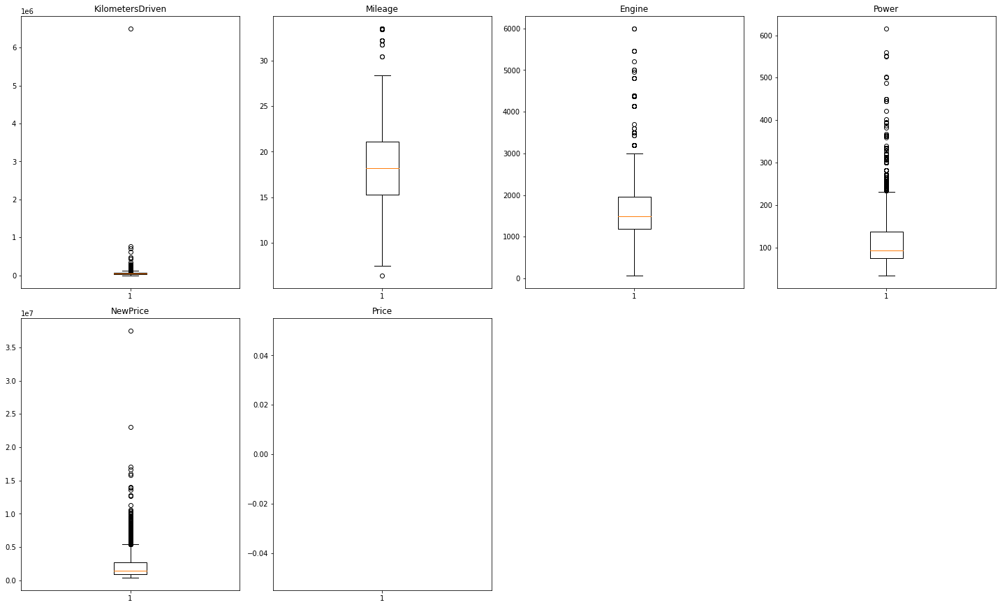

In [122]:
numeric_columns=['KilometersDriven','Mileage','Engine','Power','NewPrice','Price']
# lets look at box plot to see if outliers has been treated or not
plt.figure(figsize=(20,30))

for i, variable in enumerate(numeric_columns):
                     plt.subplot(5,4,i+1)
                     plt.boxplot(usedcars_data[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

In [123]:
# Lets treat outliers by flooring and capping
def treat_outliers(df,col):
    '''
    treats outliers in a varaible
    col: str, name of the numerical varaible
    df: data frame
    col: name of the column
    '''
    Q1=df[col].quantile(0.25) # 25th quantile
    Q3=df[col].quantile(0.75)  # 75th quantile
    IQR=Q3-Q1
    Lower_Whisker = Q1 - 1.5*IQR 
    Upper_Whisker = Q3 + 1.5*IQR
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker) # all the values samller than Lower_Whisker will be assigned value of Lower_whisker 
                                                            # and all the values above upper_whishker will be assigned value of upper_Whisker 
    return df

def treat_outliers_all(df, col_list):
    '''
    treat outlier in all numerical varaibles
    col_list: list of numerical varaibles
    df: data frame
    '''
    for c in col_list:
        df = treat_outliers(df,c)
        
    return df
    

Observations:
- All the numerical columns have outliers.
- There is one outlier on the lower side for mileage.
- We will treat these outliers as these might adversely affect the predictive power of linear model. 

## Treating Outliers

In [124]:

usedcars_data = treat_outliers_all(usedcars_data,numeric_columns)

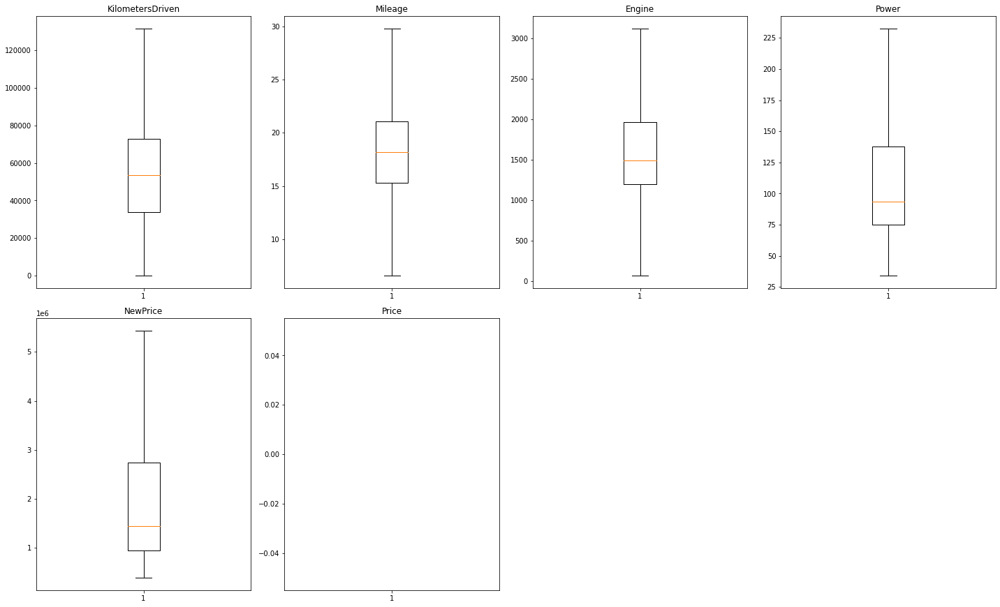

In [125]:
# lets look at box plot to see if outliers has been treated or not
plt.figure(figsize=(20,30))

for i, variable in enumerate(numeric_columns):
                     plt.subplot(5,4,i+1)
                     plt.boxplot(usedcars_data[variable],whis=1.5)
                     plt.tight_layout()
                     plt.title(variable)

plt.show()

Observations:
- All the outliers are capped.

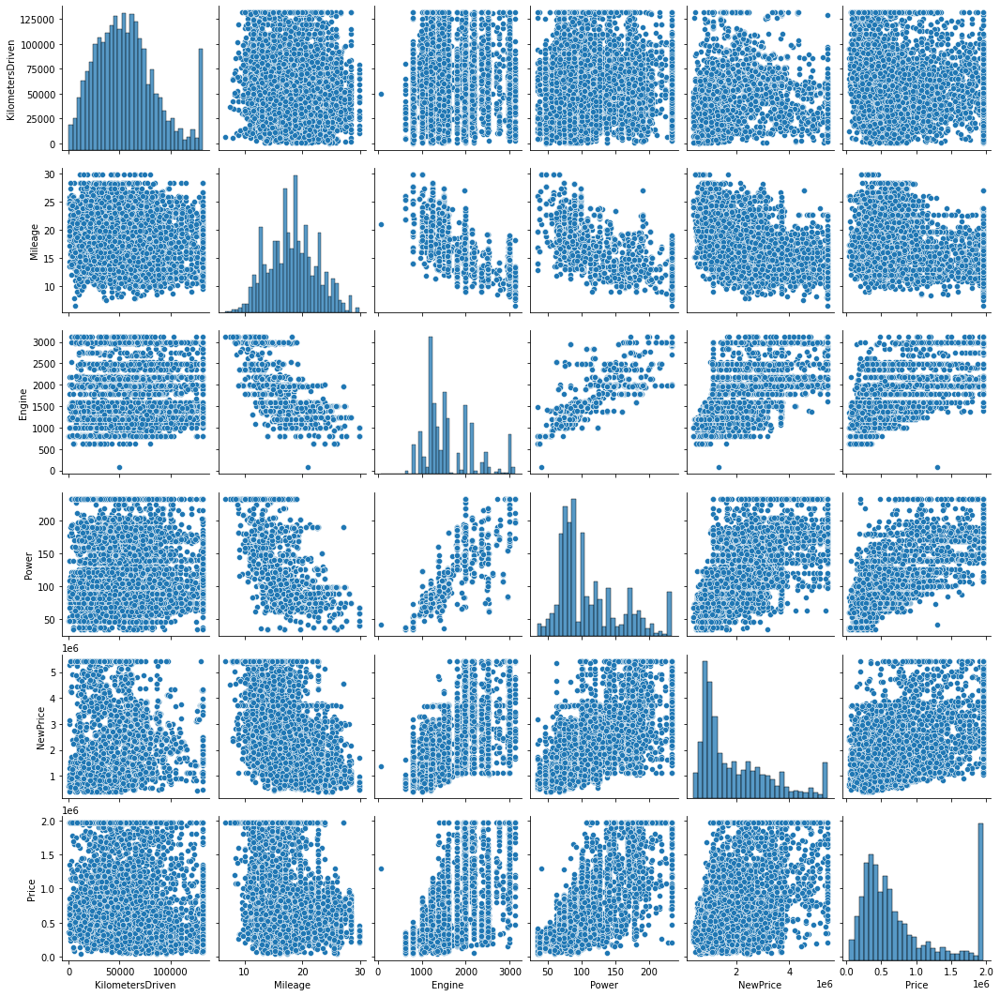

In [126]:
sns.pairplot(usedcars_data[['KilometersDriven', 'Mileage', 'Engine','Power','NewPrice','Price']]);

### Creating categories for Car Make Variable based on its mean price
Categorizing car make based on the mean price.

In [127]:
usedcars_data.groupby(["Car_make"])['Price'].mean().sort_values(ascending=False)

Car_make
LAMBORGHINI         1.962500e+06
BENTLEY             1.962500e+06
MINI-COOPER         1.951577e+06
JAGUAR              1.945825e+06
LAND-ROVER          1.886025e+06
PORSCHE             1.836222e+06
JEEP                1.824533e+06
AUDI                1.772710e+06
MERCEDES-BENZ       1.696624e+06
VOLVO               1.688190e+06
BMW                 1.677309e+06
ISUZU               1.457167e+06
TOYOTA              1.100302e+06
MITSUBISHI          1.021685e+06
FORCE-ONE           9.333333e+05
MAHINDRA            8.045919e+05
SKODA               7.416503e+05
FORD                6.040317e+05
RENAULT             5.799034e+05
HONDA               5.411743e+05
HYUNDAI             5.334485e+05
VOLKSWAGEN          5.290524e+05
NISSAN              4.738352e+05
MARUTI              4.517267e+05
TATA                3.562849e+05
FIAT                3.269286e+05
DATSUN              3.049231e+05
CHEVROLET           3.044463e+05
SMART-FORTWO        3.000000e+05
AMBASSADOR          1.350000e+05
H

In [128]:
#Binning the Car Companies based on avg prices of each Company.

temp = usedcars_data.copy()
table = temp.groupby(['Car_make'])['Price'].mean()
temp = temp.merge(table.reset_index(), how='left',on='Car_make')
bins = [0,500000,1500000,5000000,10000000,40000000]
cars_bin=['Economy','Economy-Plus','Luxury','Premium','Premium-Plus']
usedcars_data['CarType'] = pd.cut(temp['Price_y'],bins,right=False,labels=cars_bin)
usedcars_data.head()

,Year,KilometersDriven,Mileage,Engine,Power,Seats,NewPrice,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West,Location,Fuel_Type,Transmission,Owner_Type,Loc_Region,Car_make,Price,CarType
0,2010,72000.0,26.60,998.0,58.16,5,1240800.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,Mumbai,CNG,Manual,First,West,MARUTI,175000.0,Economy
1,2015,41000.0,19.67,1582.0,126.20,5,1960800.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,Pune,Diesel,Manual,First,West,HYUNDAI,1250000.0,Economy-Plus
2,2011,46000.0,18.20,1199.0,88.70,5,861000.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,Chennai,Petrol,Manual,First,South,HONDA,450000.0,Economy-Plus
3,2012,87000.0,20.77,1248.0,88.76,7,2646400.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,Chennai,Diesel,Manual,First,South,MARUTI,600000.0,Economy
4,2013,40670.0,15.20,1968.0,140.80,5,3888800.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Coimbatore,Diesel,Automatic,Second,South,AUDI,1774000.0,Luxury


In [129]:
usedcars_data['CarType'].mode()

0    Economy-Plus
Name: CarType, dtype: category
Categories (5, object): ['Economy' < 'Economy-Plus' < 'Luxury' < 'Premium' < 'Premium-Plus']

In [130]:
usedcars_data['CarType'].fillna("Economy-Plus")

0            Economy
1       Economy-Plus
2       Economy-Plus
3            Economy
4             Luxury
            ...     
7248    Economy-Plus
7249    Economy-Plus
7250         Economy
7251    Economy-Plus
7252          Luxury
Name: CarType, Length: 7253, dtype: category
Categories (5, object): ['Economy' < 'Economy-Plus' < 'Luxury' < 'Premium' < 'Premium-Plus']

## Creating Dummy Variables for Cartype and Seats

In [131]:
usedcars_data=pd.get_dummies(usedcars_data, columns=["CarType","Seats"],prefix=["CarType","Seats"], drop_first=True)

In [132]:
usedcars_data.head(5)

,Year,KilometersDriven,Mileage,Engine,Power,NewPrice,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West,Location,Fuel_Type,Transmission,Owner_Type,Loc_Region,Car_make,Price,CarType_Economy-Plus,CarType_Luxury,CarType_Premium,CarType_Premium-Plus,Seats_4,Seats_5,Seats_6,Seats_7,Seats_8,Seats_9,Seats_10
0,2010,72000.0,26.60,998.0,58.16,1240800.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,Mumbai,CNG,Manual,First,West,MARUTI,175000.0,0,0,0,0,0,1,0,0,0,0,0
1,2015,41000.0,19.67,1582.0,126.20,1960800.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,Pune,Diesel,Manual,First,West,HYUNDAI,1250000.0,1,0,0,0,0,1,0,0,0,0,0
2,2011,46000.0,18.20,1199.0,88.70,861000.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,Chennai,Petrol,Manual,First,South,HONDA,450000.0,1,0,0,0,0,1,0,0,0,0,0
3,2012,87000.0,20.77,1248.0,88.76,2646400.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,Chennai,Diesel,Manual,First,South,MARUTI,600000.0,0,0,0,0,0,0,0,1,0,0,0
4,2013,40670.0,15.20,1968.0,140.80,3888800.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,Coimbatore,Diesel,Automatic,Second,South,AUDI,1774000.0,0,1,0,0,0,1,0,0,0,0,0


## Model Building

In [133]:
#Defining X and y variables by dropping off the string variables and filtering rows with Price as Null.

X = usedcars_data[usedcars_data["Price"]>=0].drop(['Price','Car_make','Location','Fuel_Type','Transmission','Owner_Type','Loc_Region'], axis=1)
Y = usedcars_data[usedcars_data["Price"]>=0][['Price']]

print(X.head())
print(Y.head())

   Year  KilometersDriven  Mileage  Engine   Power   NewPrice  Fuel_Diesel  \
0  2010           72000.0    26.60   998.0   58.16  1240800.0          0.0   
1  2015           41000.0    19.67  1582.0  126.20  1960800.0          1.0   
2  2011           46000.0    18.20  1199.0   88.70   861000.0          0.0   
3  2012           87000.0    20.77  1248.0   88.76  2646400.0          1.0   
4  2013           40670.0    15.20  1968.0  140.80  3888800.0          1.0   

   Fuel_Electric  Fuel_LPG  Fuel_Petrol  Transmission_Manual  \
0            0.0       0.0          0.0                  1.0   
1            0.0       0.0          0.0                  1.0   
2            0.0       0.0          1.0                  1.0   
3            0.0       0.0          0.0                  1.0   
4            0.0       0.0          0.0                  0.0   

   Owner_Fourth & Above  Owner_Second  Owner_Third  Region_North  \
0                   0.0           0.0          0.0           0.0   
1         

In [134]:
# Defining the variables by the by dropping off the string variables and selecting rows with null Dependent variable Price.Lets use this as test data and predict the dependent variable from the trained model that we are going to build now.
X1 = usedcars_data[usedcars_data["Price"].isnull()].drop(['Price','Car_make','Location','Fuel_Type','Transmission','Owner_Type','Loc_Region'], axis=1)
Y1 = usedcars_data[usedcars_data["Price"].isnull()][['Price']]
print(X1.head())
print(Y1.head())

      Year  KilometersDriven  Mileage  Engine   Power   NewPrice  Fuel_Diesel  \
6019  2014           40929.0    29.80   998.0   58.20   802000.0          0.0   
6020  2013           54493.0    24.70   796.0   47.30   688400.0          0.0   
6021  2017           34000.0    13.68  2393.0  147.80  2527000.0          1.0   
6022  2012          131500.0    23.59  1364.0   82.20  2483800.0          1.0   
6023  2014           29000.0    18.50  1197.0   82.85   899400.0          0.0   

      Fuel_Electric  Fuel_LPG  Fuel_Petrol  Transmission_Manual  \
6019            0.0       0.0          0.0                  1.0   
6020            0.0       0.0          1.0                  1.0   
6021            0.0       0.0          0.0                  1.0   
6022            0.0       0.0          0.0                  1.0   
6023            0.0       0.0          1.0                  1.0   

      Owner_Fourth & Above  Owner_Second  Owner_Third  Region_North  \
6019                   0.0           0.

In [135]:
#split the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

Since all the variables are measured on different scales, lets scale them using standard scaler.

In [136]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.fit_transform(X_test)
X_train=pd.DataFrame(X_train)

In [137]:
X_train.shape

(4213, 28)

In [138]:
X_test.shape

(1806, 28)

In [139]:
Y_train.shape

(4213, 1)

In [140]:
Y_test.shape

(1806, 1)

## Choose Model, Train and Evaluate

In [141]:
#Fitting linear model

from sklearn.linear_model import LinearRegression
linearregression = LinearRegression()                                    
linearregression.fit(X_train, Y_train)                                  

print("Intercept of the linear equation:", linearregression.intercept_) 
print("\nCOefficients of the equation are:", linearregression.coef_)



Intercept of the linear equation: [771552.21932115]

COefficients of the equation are: [[ 1.78238412e+05 -3.49084233e+04 -4.59978039e+04  6.12583901e+04
   1.39808059e+05  2.04835654e+04  4.35168668e+04  1.18926318e+04
   5.28017877e+02 -3.06851675e+04 -5.81023239e+04 -6.88056701e+02
  -1.07439103e+04 -4.20349379e+03  4.01992726e+04  8.28804277e+04
   5.08212554e+04  1.42866690e+04  2.07589055e+05 -1.45519152e-11
  -4.54747351e-12  5.06625581e+03 -9.05860978e+03 -6.46464157e+02
   3.59738721e+04  3.74000946e+03 -6.65957408e+03  2.18830044e+03]]


In [142]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

pred = linearregression.predict(X_test) 
pred_train = linearregression.predict(X_train) 

## lets look at model performances

In [143]:
print('Mean Absolute Error on test:', mean_absolute_error(Y_test, pred))
print('Mean Squared Error on test:', mean_squared_error(Y_test, pred)**0.5)
print('R2 squared value on test:', r2_score(Y_test, pred))


Mean Absolute Error on test: 151423.06123509412
Mean Squared Error on test: 207496.36774553268
R2 squared value on test: 0.8730706860822391


- R^2 value is 0.87, which means that in this model, independent variables are able to explain 87% of variances in dependent variable

In [144]:
print('Mean Absolute Error on train:', mean_absolute_error(Y_train, pred_train))
print('Mean Squared Error on train:', mean_squared_error(Y_train, pred_train)**0.5)
print('R2 squared value on train:', r2_score(Y_train, pred_train))

Mean Absolute Error on train: 147782.43381153324
Mean Squared Error on train: 200470.33419583077
R2 squared value on train: 0.878266804936578


R^2 value is 0.873 on test data dn 0.878 on training data and the values are pretty close, indicating that model is not suffering from overfitting and is a good fit .

In [145]:
linearregression.coef_

array([[ 1.78238412e+05, -3.49084233e+04, -4.59978039e+04,
         6.12583901e+04,  1.39808059e+05,  2.04835654e+04,
         4.35168668e+04,  1.18926318e+04,  5.28017877e+02,
        -3.06851675e+04, -5.81023239e+04, -6.88056701e+02,
        -1.07439103e+04, -4.20349379e+03,  4.01992726e+04,
         8.28804277e+04,  5.08212554e+04,  1.42866690e+04,
         2.07589055e+05, -1.45519152e-11, -4.54747351e-12,
         5.06625581e+03, -9.05860978e+03, -6.46464157e+02,
         3.59738721e+04,  3.74000946e+03, -6.65957408e+03,
         2.18830044e+03]])

In [146]:
X.columns

Index(['Year', 'KilometersDriven', 'Mileage', 'Engine', 'Power', 'NewPrice',
       'Fuel_Diesel', 'Fuel_Electric', 'Fuel_LPG', 'Fuel_Petrol',
       'Transmission_Manual', 'Owner_Fourth & Above', 'Owner_Second',
       'Owner_Third', 'Region_North', 'Region_South', 'Region_West',
       'CarType_Economy-Plus', 'CarType_Luxury', 'CarType_Premium',
       'CarType_Premium-Plus', 'Seats_4', 'Seats_5', 'Seats_6', 'Seats_7',
       'Seats_8', 'Seats_9', 'Seats_10'],
      dtype='object')

In [147]:
# Lets look at the coefficients of each variable
coeffecients = pd.DataFrame((linearregression.coef_).T,X.columns)
coeffecients.columns = ['Coeffecient']
coeffecients

,Coeffecient
Year,1.782384e+05
KilometersDriven,-3.490842e+04
Mileage,-4.599780e+04
Engine,6.125839e+04
Power,1.398081e+05
NewPrice,2.048357e+04
Fuel_Diesel,4.351687e+04
Fuel_Electric,1.189263e+04
Fuel_LPG,5.280179e+02
Fuel_Petrol,-3.068517e+04


### Conclusion

- The Training and testing scores are around 87% and both scores are comparable, hence the model is a good fit and is not suffering from overfitting.

- R2_score is 0.87, that explains 95% of total variation in the dataset. So, overall the model is very satisfactory.

# Add-on: **statsmodels**

In [148]:
# Lets us build linear regression model using statsmodel 
import statsmodels.api as sm
X = sm.add_constant(X)
X_train1, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

olsmod0 = sm.OLS(y_train, X_train1)
olsres0 = olsmod0.fit()
print(olsres0.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.878
Model:                            OLS   Adj. R-squared:                  0.878
Method:                 Least Squares   F-statistic:                     1162.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57412.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4186   BIC:                         1.150e+05
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.105e+08 

** Observation**
- P value of a variable indicates if the variable is significant or not. If we consider significance level to be 0.05 (5%) than any variable with p-values less than 0.05 would be considered significant.
- Negative values of coefficient shows that, Price decreases with their increase.
- Positive values of coefficient shows that, Price increases with their increase.
- But these variables might contain Multicollinearity which affects the p values, so we first need to deal with multicollinearity and then look for p values 


## Checking the Linear Regression Assumptions
1. No Multicollinearity
2. Mean of residuals should be 0
3. No Heteroscedacity
4. Linearity of variables
5. Normality of error terms

### Let's check Multicollinearity using VIF scores

TEST FOR MULTICOLLINEARITY
Multicollinearity occurs when predictor variables in a regression model are correlated. This correlation is a problem because predictor variables should be independent. If the correlation between variables is high, it can cause problems when we fit the model and interpret the results. When we have multicollinearity the linear model, The coefficients that the model suggests are unreliable.

There are different ways of detecting(or testing) multi-collinearity, one such way is Variation Inflation Factor.

Variance Inflation factor: Variance inflation factors measure the inflation in the variances of the regression parameter estimates due to collinearities that exist among the predictors. It is a measure of how much the variance of the estimated regression coefficient βkis “inflated”by the existence of correlation among the predictor variables in the model.

General Rule of thumb: If VIF is 1 then there is no correlation among the kth predictor and the remaining predictor variables, and hence the variance of β̂k is not inflated at all. Whereas if VIF exceeds 5 or is close to exceeding 5, we say there is moderate VIF and if it is 10 or exceeding 10, it shows signs of high multi-collinearity.

In [149]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_series1 = pd.Series([variance_inflation_factor(X.values,i) for i in range(X.shape[1])],index=X.columns)
print("Series before feature selection: \n\n {}\n".format(vif_series1))

Series before feature selection: 

 const                   763148.805033
Year                         2.019105
KilometersDriven             1.840758
Mileage                      3.596416
Engine                       9.298777
Power                        8.482877
NewPrice                     2.333215
Fuel_Diesel                 28.481203
Fuel_Electric                1.044252
Fuel_LPG                     1.191553
Fuel_Petrol                 29.386804
Transmission_Manual          2.210694
Owner_Fourth & Above         1.012529
Owner_Second                 1.142848
Owner_Third                  1.086664
Region_North                 2.495467
Region_South                 3.606472
Region_West                  3.124364
CarType_Economy-Plus         1.670678
CarType_Luxury               4.351576
CarType_Premium                   NaN
CarType_Premium-Plus              NaN
Seats_4                      7.363211
Seats_5                     53.146312
Seats_6                      3.216460
Seats_7       

## Removing Multicollinearity
 * To remove multicollinearity
  1. Drop every column one by one, that has VIF score greater than 5.
  2. Look at the adjusted R square of all these models
  3. Drop the Variable that makes least change in Adjusted-R square
  4. Check the VIF Scores again
  5. Continue till you get all VIF scores under 5

## MODEL 2

In [150]:
# we drop the one with the highest vif values and check the Adjusted-R Squared
X_train2 = X_train1.drop('Seats_5', axis=1)
vif_series2 = pd.Series([variance_inflation_factor(X_train2.values,i) for i in range(X_train2.shape[1])],index=X_train2.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series2))

Series before feature selection: 

const                   778375.025048
Year                         2.020056
KilometersDriven             1.824917
Mileage                      3.701759
Engine                       9.504383
Power                        8.374664
NewPrice                     2.338144
Fuel_Diesel                 28.696913
Fuel_Electric                1.038743
Fuel_LPG                     1.225926
Fuel_Petrol                 29.780257
Transmission_Manual          2.194404
Owner_Fourth & Above         1.009931
Owner_Second                 1.141396
Owner_Third                  1.092134
Region_North                 2.487597
Region_South                 3.621005
Region_West                  3.103202
CarType_Economy-Plus         1.666868
CarType_Luxury               4.249595
CarType_Premium                   NaN
CarType_Premium-Plus              NaN
Seats_4                      1.047137
Seats_6                      1.061468
Seats_7                      1.912217
Seats_8        

In [151]:
olsmod1 = sm.OLS(y_train, X_train2)
olsres1 = olsmod1.fit()
print(olsres1.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.878
Model:                            OLS   Adj. R-squared:                  0.878
Method:                 Least Squares   F-statistic:                     1208.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57412.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4187   BIC:                         1.150e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.105e+08 

## MODEL 3

In [152]:
# we drop the one with the highest vif values
X_train3 = X_train2.drop('Fuel_Petrol', axis=1)
vif_series3 = pd.Series([variance_inflation_factor(X_train3.values,i) for i in range(X_train3.shape[1])],index=X_train3.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series3))

Series before feature selection: 

const                   778202.858594
Year                         2.020056
KilometersDriven             1.817557
Mileage                      3.519173
Engine                       9.404220
Power                        8.365192
NewPrice                     2.337272
Fuel_Diesel                  2.474026
Fuel_Electric                1.009088
Fuel_LPG                     1.007215
Transmission_Manual          2.194042
Owner_Fourth & Above         1.009930
Owner_Second                 1.141394
Owner_Third                  1.092128
Region_North                 2.487061
Region_South                 3.620193
Region_West                  3.094001
CarType_Economy-Plus         1.658320
CarType_Luxury               4.246937
CarType_Premium                   NaN
CarType_Premium-Plus              NaN
Seats_4                      1.045615
Seats_6                      1.061287
Seats_7                      1.901556
Seats_8                      1.318105
Seats_9        

In [153]:
olsmod2 = sm.OLS(y_train, X_train3)
olsres2 = olsmod2.fit()
print(olsres2.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.878
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     1258.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57414.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4188   BIC:                         1.150e+05
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.106e+08 

## MODEL 4

### Let's drop the variable 'Engine'

In [154]:
X_train4 = X_train3.drop(['Engine'], axis=1)
vif_series4 = pd.Series([variance_inflation_factor(X_train4.values,i) for i in range(X_train4.shape[1])],index=X_train4.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series4))

Series before feature selection: 

const                   777271.080364
Year                         2.018506
KilometersDriven             1.810777
Mileage                      2.992321
Power                        5.071591
NewPrice                     2.274512
Fuel_Diesel                  2.072695
Fuel_Electric                1.004933
Fuel_LPG                     1.007199
Transmission_Manual          2.194035
Owner_Fourth & Above         1.009572
Owner_Second                 1.141361
Owner_Third                  1.092054
Region_North                 2.487051
Region_South                 3.620178
Region_West                  3.093794
CarType_Economy-Plus         1.646292
CarType_Luxury               4.225724
CarType_Premium                   NaN
CarType_Premium-Plus              NaN
Seats_4                      1.043656
Seats_6                      1.030876
Seats_7                      1.674650
Seats_8                      1.230229
Seats_9                      1.006170
Seats_10       

### Now none of the variables have VIF indicating high multicollinearity.
vif has come down to quite a good limit, now we can say features are not correlated

In [155]:
olsmod3 = sm.OLS(y_train, X_train4)
olsres3 = olsmod3.fit()
print(olsres3.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     1297.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57436.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4189   BIC:                         1.151e+05
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  -1.1e+08 

## MODEL 5

### Let's drop the variable 'Owner_Fourth & Above', since it has highest p value among all with p value greater than 0.05

In [156]:
X_train5 = X_train4.drop(['Owner_Fourth & Above'], axis=1)

In [157]:
olsmod4 = sm.OLS(y_train, X_train5)
olsres4 = olsmod4.fit()
print(olsres4.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     1356.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57436.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4190   BIC:                         1.151e+05
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  -1.1e+08 

## MODEL 6

### Now Fuel_LPG has highest p value among all variables with p value greater than 0.05, so we will drop that

In [158]:
X_train6 = X_train5.drop(['Fuel_LPG'], axis=1)

In [159]:
olsmod5 = sm.OLS(y_train, X_train6)
olsres5 = olsmod5.fit()
print(olsres5.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     1421.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57437.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4191   BIC:                         1.151e+05
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.099e+08 

## MODEL 7

### Now Owner_Third has highest p value among all variables with p value greater than 0.05, so we will drop that

In [160]:
X_train7 = X_train6.drop(['Owner_Third'], axis=1)

In [161]:
olsmod6 = sm.OLS(y_train, X_train7)
olsres6 = olsmod6.fit()
print(olsres6.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     1492.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57437.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4192   BIC:                         1.150e+05
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.106e+08 

## MODEL 8

### Now Seats_6 has highest p value among all variables with p value greater than 0.05, so we will drop that

In [162]:
X_train8 = X_train7.drop(['Seats_6'], axis=1)

In [163]:
olsmod7 = sm.OLS(y_train, X_train8)
olsres7 = olsmod7.fit()
print(olsres7.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     1570.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57439.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4193   BIC:                         1.150e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.107e+08 

## MODEL 9

### Now Seats_10 has highest p value among all variables with p value greater than 0.05, so we will drop that

In [164]:
X_train9 = X_train8.drop(['Seats_10'], axis=1)

In [165]:
olsmod8 = sm.OLS(y_train, X_train9)
olsres8 = olsmod8.fit()
print(olsres8.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     1656.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57440.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4194   BIC:                         1.150e+05
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.105e+08 

## MODEL 10

### Now Seats_9 has highest p value among all variables with p value greater than 0.05, so we will drop that

In [166]:
X_train10 = X_train9.drop(['Seats_9'], axis=1)

In [167]:
olsmod9 = sm.OLS(y_train, X_train10)
olsres9 = olsmod9.fit()
print(olsres9.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     1753.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:47   Log-Likelihood:                -57441.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4195   BIC:                         1.150e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.104e+08 

from scipy.stats import boxcox

fitted_data,fitted_lambda=stats.boxcox(y_train['Price'])
print(fitted_data,fitted_lambda)

olsmod13 = sm.OLS(fitted_data, X_train14)
olsres13 = olsmod13.fit()
print(olsres13.summary())

olsmod13 = sm.OLS(np.log(y_train), X_train14)
olsres13 = olsmod13.fit()
print(olsres13.summary())

### Now no feature has p value greater than 0.05, so we'll consider features in X_train10 as the final ones and olsres9 as final model

Observations:
- Now Adjusted R-squared is 0.876, Our model is able to explain 87.6% of variance that shows model is good.
- The Adjusted-R squared in Olsres0 it was 87.8% (Where we considered all the variables) this shows that the variables we dropped were not affecting the model much.

### Now we'll check rest of the assumptions on model - olsres9
1. Mean of residuals should be 0 
2. Linearity of variables
3. Normality of error terms
4. No Heteroscedacity

### Mean of residuals should be 0

In [168]:
residual= olsres9.resid
np.mean(residual)

1.0552915127507134e-05

Mean of redisuals is very close to 0. 

So, the first assumption is satisfied.

### TEST FOR LINEARITY

In [169]:
residual=olsres9.resid
fitted=olsres9.fittedvalues #predicted values

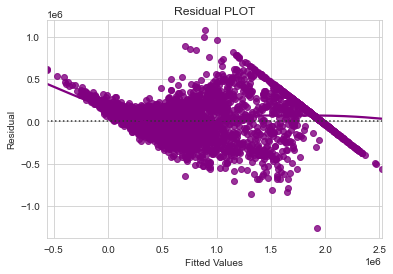

In [170]:
sns.set_style("whitegrid")
sns.residplot(fitted,residual,color="purple",lowess=True)
plt.xlabel("Fitted Values")
plt.ylabel("Residual")
plt.title("Residual PLOT")
plt.show()

Scatter plot shows the distribution of residuals (errors) vs fitted values (predicted values) - If there exist any pattern in this plot, we consider it as signs of non-linearity in the data and a pattern means that the model doesn’t capture non-linear effects.

No pattern in residual hence linearity of variables assumptions is satisfied

### TEST FOR NORMALITY
**What is the test?**

* Error terms/Residuals should be normally distributed

* If the error terms are non- normally distributed, confidence intervals may become too wide or narrow. Once confidence interval becomes unstable, it leads to difficulty in estimating coefficients based on minimization of least squares.

**What do non-normality indicate?**

* It suggests that there are a few unusual data points which must be studied closely to make a better model.

**How to Check the Normality?**

* It can be checked via QQ Plot, Residuals following normal distribution will make a straight line plot otherwise not.

* Other test to check for normality : Shapiro-Wilk test.

**What is the residuals are not-normal?**

* We can apply transformations like log, exponential, arcsinh etc as per our data

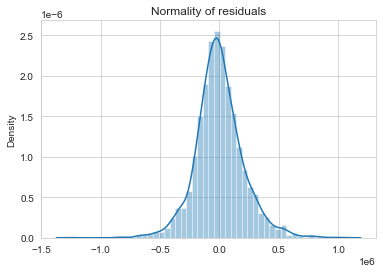

In [171]:
sns.distplot(residual)
plt.title('Normality of residuals')
plt.show()

Error terms seem to be approximately normally distributed, so the assumption on the linear modeling seems to be fulfilled.

#### The QQ plot of residuals can be used to visually check the normality assumption. The normal probability plot of residuals should approximately follow a straight line.

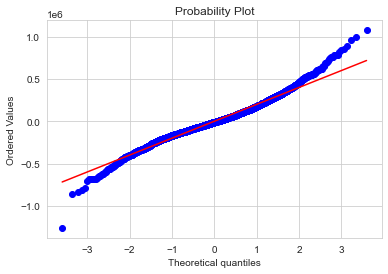

In [172]:
import pylab
import scipy.stats as stats
stats.probplot(residual,dist="norm",plot=pylab)
plt.show()

In [173]:
stats.shapiro(residual)

(0.9763731956481934, 6.94819687373967e-26)

* The residuals are not normal as per shapiro test, but as per QQ plot they are approximately normal.
* The issue with shapiro test is when dataset is big, even for small deviations, it shows data as not normal
* Hence we go with QQ plot and say that residuals are normal
* We can try to treat data for outliers and see if that helps in further normalising the residual curve

### TEST FOR HOMOSCEDASTICITY

* Test -goldfeldquandt test

* Homoscedacity - If the variance of the residuals are symmetrically distributed across the regression line , then the data is said to homoscedastic.

* Heteroscedacity - If the variance is unequal for the residuals across the regression line, then the data is said to be heteroscedastic. In this case the residuals can form an arrow shape or any other non symmetrical shape.

Null hypothesis : Residuals are homoscedastic

Alternate hypothesis : Residuals have hetroscedasticity

In [174]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(residual, X_train10)
lzip(name, test)

[('F statistic', 1.073586664824917), ('p-value', 0.05236792664325703)]

Since p-value > 0.05 we can say that the residuals are homoscedastic. This assumption is therefore valid in the data.

### Now we have checked all the assumptions and they are satisfied, so we can move towards prediction part

In [175]:
X_test_final = X_test[X_train10.columns]
y_pred = olsres9.predict(X_test_final)

### Checking the performance on train and test: metric used - RMSE

#Checking root mean squared error on both train and test set  

from sklearn.metrics import mean_squared_error
rms = np.sqrt(mean_squared_error(y_train, fitted))
print('Train error:',rms)

rms1 = np.sqrt(mean_squared_error(y_test, y_pred))
print('Test error:',rms1)

In [176]:
#Checking root mean squared error on both train and test set  
from sklearn.metrics import mean_squared_error
rms = np.sqrt(mean_squared_error(y_train, fitted))
print('Train error:',rms)

rms1 = np.sqrt(mean_squared_error(y_test, y_pred))
print('Test error:',rms1)

Train error: 201851.09642761433
Test error: 208614.44868747026


from scipy.special import inv_boxcox
converted_data_train=inv_boxcox(961974.9655533391,0.054411978297724546)
converted_data_train

from scipy.special import inv_boxcox
converted_data_test=inv_boxcox(964799.930544571,0.054411978297724546)
converted_data_test

### Now we can finally see that both the errors are comparable. so our model is not suffering from overfitting .
### Hence we can conclude the model "olsres13" is good for prediction as well as inference purpose


In [177]:
olsmod9 = sm.OLS(y_train, X_train10)
olsres9 = olsmod9.fit()
print(olsres9.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.877
Model:                            OLS   Adj. R-squared:                  0.876
Method:                 Least Squares   F-statistic:                     1753.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:49   Log-Likelihood:                -57441.
No. Observations:                4213   AIC:                         1.149e+05
Df Residuals:                    4195   BIC:                         1.150e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.104e+08 

### Observations
Now this is our final model which follows all the assumptions and this can be used for interpretation


- Power variable has a significant impact on the used car price.  A unit increase in power, increases the used car price by 3776 units. 
- Increase in Mileage value leads to decrease in used car price. A unit increase in mileage reduces the car price by approximately -14310 units. 
- The model Year has a significant positive impact on the used car price. A unit increase in year increases the used car price by 5540 units. 
- Cars with diesel engines have higher price. 
- Kilometers driven has a small negative impact on the Used car Price. A unit increase in km driven will decrease the price by -1.123 units.
- Manual cars tend to have less used car price, but  the Automatic cars have higher Price value.
- Region_South has more sales compared to other regions.
- The used car prices tend to decrease for Second owner type cars.
- The used car prices increase as we move from economy plus to luxury car. However, premium and premium plus have no impact, indicating that these higher priced cars depreciate more than the others. 


## Forward Feature Selection 
### forward feature selection starts with an empty model and adds in variables one by one.
* In each forward step, you add the one variable that gives the single best improvement to your model.


In [178]:
X_train_new = X_train4.drop('const', axis = 1)

* We'll use forward feature selection on variables, we received after removing multicollinearity
* Also we'll remove const term, because sklearn adds that automatically unlike statmodels

In [179]:
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
clf = LinearRegression()

# Build step forward feature selection
sfs1 = sfs(clf,k_features = 25,forward=True,
           floating=False, scoring= 'r2',
           verbose=2,
           cv=5)

 # Perform SFFS
sfs1 = sfs1.fit(X_train_new, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.3s finished

[2021-02-26 19:22:50] Features: 1/25 -- score: 0.6612329864541664[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.3s finished

[2021-02-26 19:22:50] Features: 2/25 -- score: 0.7819465528350249[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  23 out of  23 | elapsed:    0.3s finished

[2021-02-26 19:22:50] Features: 3/25 -- score: 0.8298833218407207[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

### We can see that Adjusted-R square starts decreasing after addition of 20th feature, so we will proceed only with best 19 features

* Now we'll change k_features to 19, where k_features denotes "Number of features to select"

In [180]:
clf = LinearRegression()

# # Build step forward feature selection
sfs1 = sfs(clf,k_features = 19,forward=True,
           floating=False, scoring='r2',
           verbose=2,
           cv=5)

 # Perform SFFS
sfs1 = sfs1.fit(X_train_new, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    0.3s finished

[2021-02-26 19:22:54] Features: 1/19 -- score: 0.6612329864541664[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    0.3s finished

[2021-02-26 19:22:54] Features: 2/19 -- score: 0.7819465528350249[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  23 out of  23 | elapsed:    0.3s finished

[2021-02-26 19:22:55] Features: 3/19 -- score: 0.8298833218407207[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

In [181]:
# Now Which features are important?
feat_cols = list(sfs1.k_feature_idx_)
print(feat_cols)

[0, 1, 2, 3, 4, 5, 8, 10, 12, 13, 14, 15, 16, 17, 19, 21, 22, 23, 24]


In [182]:
# After removing multicollinearity,we ended up with X_train4
X_train4.columns[feat_cols]

Index(['const', 'Year', 'KilometersDriven', 'Mileage', 'Power', 'NewPrice',
       'Fuel_LPG', 'Owner_Fourth & Above', 'Owner_Third', 'Region_North',
       'Region_South', 'Region_West', 'CarType_Economy-Plus', 'CarType_Luxury',
       'CarType_Premium-Plus', 'Seats_6', 'Seats_7', 'Seats_8', 'Seats_9'],
      dtype='object')

### Now we will fit a sklearn model using these features only

In [183]:
# After removing multicollinearity,we ended up with X_train4.So lets train this model using the features that we got from feature selection.
X_train_final = X_train4[X_train4.columns[feat_cols]]

In [184]:
#Creating new x_test with the same 18 variables that we selected for x_train
X_test_final = X_test[X_train_final.columns]
X_test_final.columns

Index(['const', 'Year', 'KilometersDriven', 'Mileage', 'Power', 'NewPrice',
       'Fuel_LPG', 'Owner_Fourth & Above', 'Owner_Third', 'Region_North',
       'Region_South', 'Region_West', 'CarType_Economy-Plus', 'CarType_Luxury',
       'CarType_Premium-Plus', 'Seats_6', 'Seats_7', 'Seats_8', 'Seats_9'],
      dtype='object')

In [185]:
#Fitting linear model

from sklearn.linear_model import LinearRegression
linearregression = LinearRegression()                                    
linearregression.fit(X_train_final, y_train)                                  

print("Intercept of the linear equation:", linearregression.intercept_) 
print("\nCOefficients of the equation are:", linearregression.coef_)

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

predicted = linearregression.predict(X_train_final)
pred = linearregression.predict(X_test_final)  

Intercept of the linear equation: [-1.19277221e+08]

COefficients of the equation are: [[ 0.00000000e+00  5.92233454e+04 -4.11710055e-01 -3.16485904e+03
   4.80934054e+03  3.43347882e-02  4.54997649e+04 -6.22126945e+03
  -2.20939719e+04  1.03276820e+05  1.68198966e+05  1.11485524e+05
   4.17215488e+04  6.53703644e+05  7.27595761e-11  1.20974351e+05
   2.39649814e+05  1.88620528e+05 -1.31628733e+05]]


In [186]:
# R2 Squared: on train and test
print('r2 score on train data :', r2_score(y_train, predicted))
print('r2 score on test data :', r2_score(y_test, pred))

r2 score on train data : 0.8610584698400926
r2 score on test data : 0.8581609090360561


In [187]:
# RMSE on train and test data
print('rmse on train data :', mean_squared_error(y_train, predicted)**0.5)
print('rmse on test data :', mean_squared_error(y_test, pred)**0.5)

rmse on train data : 214171.4823914957
rmse on test data : 219344.88029989737


Both r2 score and RMSE shows that model fitted is good, has no overfitting and can be used for making predictions.
As we see, the results from 'olsreg13' and 'linearegession' model are approximately same.

### Lets Predict the target (Price)variable in test dataset that has null values and then train the model on the new dataset.

In [188]:
X11 = sm.add_constant(X1)


In [189]:
X11.head(2)

,const,Year,KilometersDriven,Mileage,Engine,Power,NewPrice,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West,CarType_Economy-Plus,CarType_Luxury,CarType_Premium,CarType_Premium-Plus,Seats_4,Seats_5,Seats_6,Seats_7,Seats_8,Seats_9,Seats_10
6019,1.0,2014,40929.0,29.8,998.0,58.2,802000.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0
6020,1.0,2013,54493.0,24.7,796.0,47.3,688400.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0,0,0,0,1,0,0,0,0,0


In [190]:


X11=X11[['const', 'Year', 'KilometersDriven', 'Mileage', 'Power', 'NewPrice',
       'Fuel_LPG', 'Owner_Fourth & Above', 'Owner_Third', 'Region_North',
       'Region_South', 'Region_West', 'CarType_Economy-Plus', 'CarType_Luxury',
       'CarType_Premium-Plus', 'Seats_6', 'Seats_7', 'Seats_8', 'Seats_9']]

In [191]:
pred_Y1 = linearregression.predict(X11) 
pred_Y1 = pd.DataFrame(pred_Y1,columns={"Price"})
print(pred_Y1.shape)
print(X11.shape)


(1234, 1)
(1234, 19)


In [192]:
#Merging the two data frames (independent and dependent variables) into df2
X1['idx'] = X1.index
X1.reset_index(inplace=True)
pred_Y1['idx'] = pred_Y1.index

df2 = X1.merge(pred_Y1, left_index=True, right_on='idx')
df2.drop(df2.columns[df2.columns.str.startswith('i')], axis=1, inplace=True)

In [193]:
df2.columns

Index(['Year', 'KilometersDriven', 'Mileage', 'Engine', 'Power', 'NewPrice',
       'Fuel_Diesel', 'Fuel_Electric', 'Fuel_LPG', 'Fuel_Petrol',
       'Transmission_Manual', 'Owner_Fourth & Above', 'Owner_Second',
       'Owner_Third', 'Region_North', 'Region_South', 'Region_West',
       'CarType_Economy-Plus', 'CarType_Luxury', 'CarType_Premium',
       'CarType_Premium-Plus', 'Seats_4', 'Seats_5', 'Seats_6', 'Seats_7',
       'Seats_8', 'Seats_9', 'Seats_10', 'Price'],
      dtype='object')

In [194]:
# Concatenating the trained dataset into df1
df1=pd.concat([X,Y],axis=1)

In [195]:
df1.shape

(6019, 30)

In [196]:
# Dropping the constant
df1=df1.drop('const', axis = 1)

In [197]:
# Concatenating the trained dataset and test dataset where we predicted dependent variable into frame1
frame1=pd.concat([df1,df2])

frame1.head()

,Year,KilometersDriven,Mileage,Engine,Power,NewPrice,Fuel_Diesel,Fuel_Electric,Fuel_LPG,Fuel_Petrol,Transmission_Manual,Owner_Fourth & Above,Owner_Second,Owner_Third,Region_North,Region_South,Region_West,CarType_Economy-Plus,CarType_Luxury,CarType_Premium,CarType_Premium-Plus,Seats_4,Seats_5,Seats_6,Seats_7,Seats_8,Seats_9,Seats_10,Price
0,2010,72000.0,26.60,998.0,58.16,1240800.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,1,0,0,0,0,0,175000.0
1,2015,41000.0,19.67,1582.0,126.20,1960800.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1,0,0,0,0,1,0,0,0,0,0,1250000.0
2,2011,46000.0,18.20,1199.0,88.70,861000.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1,0,0,0,0,1,0,0,0,0,0,450000.0
3,2012,87000.0,20.77,1248.0,88.76,2646400.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,1,0,0,0,600000.0
4,2013,40670.0,15.20,1968.0,140.80,3888800.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,1,0,0,0,1,0,0,0,0,0,1774000.0


In [198]:
frame1.drop(frame1.columns[frame1.columns.str.startswith('l')], axis=1, inplace=True)

In [199]:
frame1.shape

(7253, 29)

In [200]:
# Lets verify if there are any null values.
frame1.isnull().sum()

Year                    0
KilometersDriven        0
Mileage                 0
Engine                  0
Power                   0
NewPrice                0
Fuel_Diesel             0
Fuel_Electric           0
Fuel_LPG                0
Fuel_Petrol             0
Transmission_Manual     0
Owner_Fourth & Above    0
Owner_Second            0
Owner_Third             0
Region_North            0
Region_South            0
Region_West             0
CarType_Economy-Plus    0
CarType_Luxury          0
CarType_Premium         0
CarType_Premium-Plus    0
Seats_4                 0
Seats_5                 0
Seats_6                 0
Seats_7                 0
Seats_8                 0
Seats_9                 0
Seats_10                0
Price                   0
dtype: int64

# Experiment

### Fitting the linear regression on test data combined with trained data

In [201]:
# Separating the independent and dependent variables to build the model
X_Full = frame1.drop(['Price'], axis=1)
Y_Full = frame1[['Price']]

In [202]:
X_Full.shape

(7253, 28)

In [203]:
Y_Full.shape

(7253, 1)

In [204]:
# Splitting the data into 70-30% ratio as training-test datasets
from sklearn.model_selection import train_test_split
X1_train1, X1_test, y1_train, y1_test = train_test_split(X_Full, Y_Full, test_size=0.3, random_state=42)

from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X1_train=sc.fit_transform(X1_train1)
X1_test=sc.fit_transform(X1_test)
X1_train=pd.DataFrame(X1_train1)

from sklearn.preprocessing import MinMaxScaler
MM=MinMaxScaler()
X1_train=MM.fit_transform(X1_train1)
X1_test=MM.fit_transform(X1_test)
X1_train=pd.DataFrame(X1_train1)

In [205]:
from sklearn.linear_model import LinearRegression
lreg = LinearRegression()                                    
lreg.fit(X1_train1, y1_train)                                  

print("Intercept of the linear equation:", lreg.intercept_) 
print("\nCOefficients of the equation are:", lreg.coef_)

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

pred1 = lreg.predict(X1_test) 


Intercept of the linear equation: [-1.08664437e+08]

COefficients of the equation are: [[ 5.41537209e+04 -1.02442474e+00 -1.04594811e+04  6.41628579e+01
   3.49528472e+03  2.17448586e-02  8.69498710e+04  7.90435415e+05
   3.39851710e+04 -3.47104171e+04 -9.56600120e+04  4.90836149e+03
  -3.26193084e+04 -1.98149616e+04  9.85136823e+04  1.65374681e+05
   1.07183689e+05  2.36069940e+04  5.72438547e+05 -3.20142135e-10
  -1.68802217e-09 -2.96658062e+04 -9.31946156e+04 -6.84517922e+04
   6.99976605e+04 -1.62008306e+04 -3.38568286e+05 -4.74742175e+04]]


In [206]:
print('Mean Absolute Error on test:', mean_absolute_error(y1_test, pred1))
print('Mean Squared Error on test:', mean_squared_error(y1_test, pred1)**0.5)
print('R2 squared value on test:', r2_score(y1_test, pred1))


Mean Absolute Error on test: 129525.45438820754
Mean Squared Error on test: 187023.11637769613
R2 squared value on test: 0.8921340509059907


R^2 value is 0.89 on test data and it does not seem to be a good fit for this dataset.
Lets implement stats model and see the results.

### Stats model

In [207]:
import statsmodels.api as sm
X_Full = sm.add_constant(X_Full)
X1_train1, X1_test, y1_train, y1_test = train_test_split(X_Full, Y_Full, test_size=0.3, random_state=42)

olsmod0 = sm.OLS(y1_train, X1_train1)
olsres0 = olsmod0.fit()
print(olsres0.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     1594.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:58   Log-Likelihood:                -68822.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5050   BIC:                         1.379e+05
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.087e+08 

## Checking the Linear Regression Assumptions
1. No Multicollinearity
2. Mean of residuals should be 0
3. No Heteroscedacity
4. Linearity of variables
5. Normality of error terms

### Let's check Multicollinearity using VIF scores
* Multicollinearity occurs when predictor variables in a regression model are correlated. This correlation is a problem because predictor variables should be independent.  If the correlation between variables is high, it can cause problems when we fit the model and interpret the results. When we have multicollinearity the linear model, The coefficients that the model suggests are unreliable.

* There are different ways of detecting(or  testing) multi-collinearity, one such way is Variation Inflation Factor.


In [208]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_series1 = pd.Series([variance_inflation_factor(X_Full.values,i) for i in range(X_Full.shape[1])],index=X_Full.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series1))

Series before feature selection: 

const                   759644.410606
Year                         1.990762
KilometersDriven             1.813056
Mileage                      3.576032
Engine                       9.096655
Power                        8.254024
NewPrice                     2.319368
Fuel_Diesel                 30.959956
Fuel_Electric                1.039411
Fuel_LPG                     1.208095
Fuel_Petrol                 31.745885
Transmission_Manual          2.193408
Owner_Fourth & Above         1.014414
Owner_Second                 1.145446
Owner_Third                  1.081848
Region_North                 2.461147
Region_South                 3.556934
Region_West                  3.103949
CarType_Economy-Plus         1.654102
CarType_Luxury               4.266709
CarType_Premium                   NaN
CarType_Premium-Plus              NaN
Seats_4                      7.801856
Seats_5                     56.616007
Seats_6                      3.376556
Seats_7        

### Model 2

In [209]:
# we drop the one with the highest vif values and check the Adjusted-R Squared
X1_train2 = X1_train1.drop('Seats_5', axis=1)
vif_series2 = pd.Series([variance_inflation_factor(X_train2.values,i) for i in range(X_train2.shape[1])],index=X_train2.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series2))

Series before feature selection: 

const                   778375.025048
Year                         2.020056
KilometersDriven             1.824917
Mileage                      3.701759
Engine                       9.504383
Power                        8.374664
NewPrice                     2.338144
Fuel_Diesel                 28.696913
Fuel_Electric                1.038743
Fuel_LPG                     1.225926
Fuel_Petrol                 29.780257
Transmission_Manual          2.194404
Owner_Fourth & Above         1.009931
Owner_Second                 1.141396
Owner_Third                  1.092134
Region_North                 2.487597
Region_South                 3.621005
Region_West                  3.103202
CarType_Economy-Plus         1.666868
CarType_Luxury               4.249595
CarType_Premium                   NaN
CarType_Premium-Plus              NaN
Seats_4                      1.047137
Seats_6                      1.061468
Seats_7                      1.912217
Seats_8        

In [210]:
olsmod1 = sm.OLS(y1_train, X1_train2)
olsres1 = olsmod1.fit()
print(olsres1.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     1658.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68823.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5051   BIC:                         1.379e+05
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.088e+08 

## Removing Multicollinearity
 * To remove multicollinearity
  1. Drop every column one by one, that has VIF score greater than 5.
  2. Look at the adjusted R square of all these models
  3. Drop the Variable that makes least change in Adjusted-R square
  4. Check the VIF Scores again
  5. Continue till you get all VIF scores under 5

In [211]:
# we drop the one with the highest vif values and check the Adjusted-R Squared
X1_train3 = X1_train2.drop('Fuel_Petrol', axis=1)
vif_series2 = pd.Series([variance_inflation_factor(X1_train3.values,i) for i in range(X1_train3.shape[1])],index=X1_train3.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series2))

Series before feature selection: 

const                   756837.829533
Year                         1.999159
KilometersDriven             1.792156
Mileage                      3.497215
Engine                       8.858660
Power                        8.109754
NewPrice                     2.321785
Fuel_Diesel                  2.466563
Fuel_Electric                1.006344
Fuel_LPG                     1.007373
Transmission_Manual          2.195489
Owner_Fourth & Above         1.020273
Owner_Second                 1.158956
Owner_Third                  1.090213
Region_North                 2.515659
Region_South                 3.626236
Region_West                  3.130299
CarType_Economy-Plus         1.677319
CarType_Luxury               4.326017
CarType_Premium                   NaN
CarType_Premium-Plus              NaN
Seats_4                      1.050714
Seats_6                      1.062710
Seats_7                      1.826163
Seats_8                      1.321413
Seats_9        

In [212]:
olsmod2 = sm.OLS(y1_train, X1_train3)
olsres2 = olsmod2.fit()
print(olsres2.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.891
Method:                 Least Squares   F-statistic:                     1726.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68824.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5052   BIC:                         1.379e+05
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.089e+08 

In [213]:
# we drop the one with the highest vif values
X1_train4 = X1_train3.drop('Engine', axis=1)
vif_series3 = pd.Series([variance_inflation_factor(X1_train4.values,i) for i in range(X1_train4.shape[1])],index=X1_train4.columns)
print('Series before feature selection: \n\n{}\n'.format(vif_series3))

Series before feature selection: 

const                   756082.947024
Year                         1.997950
KilometersDriven             1.783870
Mileage                      2.958658
Power                        5.009987
NewPrice                     2.263806
Fuel_Diesel                  2.053366
Fuel_Electric                1.006166
Fuel_LPG                     1.007373
Transmission_Manual          2.195351
Owner_Fourth & Above         1.019506
Owner_Second                 1.158819
Owner_Third                  1.090149
Region_North                 2.514837
Region_South                 3.626192
Region_West                  3.130229
CarType_Economy-Plus         1.665595
CarType_Luxury               4.301222
CarType_Premium                   NaN
CarType_Premium-Plus              NaN
Seats_4                      1.047368
Seats_6                      1.031941
Seats_7                      1.631745
Seats_8                      1.241377
Seats_9                      1.005131
Seats_10       

Now, none of the variables have VIF values that are significant.

In [214]:
olsmod3 = sm.OLS(y1_train, X1_train4)
olsres3 = olsmod3.fit()
print(olsres3.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     1792.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68836.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5053   BIC:                         1.379e+05
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.085e+08 

In [215]:
X1_train5 = X1_train4.drop(['Owner_Fourth & Above'], axis=1)

In [216]:
olsmod4 = sm.OLS(y1_train, X1_train5)
olsres4 = olsmod4.fit()
print(olsres4.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     1874.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68836.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5054   BIC:                         1.379e+05
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.085e+08 

In [217]:
X1_train6 = X1_train5.drop(['Owner_Third'], axis=1)

In [218]:
olsmod5 = sm.OLS(y1_train, X1_train6)
olsres5 = olsmod5.fit()
print(olsres5.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     1963.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68837.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5055   BIC:                         1.379e+05
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.089e+08 

In [219]:
X1_train7 = X1_train6.drop(['Seats_10'], axis=1)

In [220]:
olsmod6 = sm.OLS(y1_train, X1_train7)
olsres6 = olsmod6.fit()
print(olsres6.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     2061.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68837.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5056   BIC:                         1.379e+05
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.089e+08 

In [221]:
X1_train7 = X1_train6.drop(['Fuel_LPG'], axis=1)

In [222]:
olsmod6 = sm.OLS(y1_train, X1_train7)
olsres6 = olsmod6.fit()
print(olsres6.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     2061.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68837.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5056   BIC:                         1.379e+05
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.088e+08 

In [223]:
X1_train8 = X1_train7.drop(['Seats_10'], axis=1)

In [224]:
olsmod7 = sm.OLS(y1_train, X1_train8)
olsres7 = olsmod7.fit()
print(olsres7.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     2170.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68838.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5057   BIC:                         1.378e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.088e+08 

In [225]:
X1_train9 = X1_train8.drop(['Seats_6'], axis=1)

In [226]:
olsmod8 = sm.OLS(y1_train, X1_train9)
olsres8 = olsmod8.fit()
print(olsres8.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     2289.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68839.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5058   BIC:                         1.378e+05
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.089e+08 

In [227]:
X1_train10 = X1_train9.drop(['Seats_9'], axis=1)

In [228]:
olsmod9 = sm.OLS(y1_train, X1_train10)
olsres9 = olsmod9.fit()
print(olsres9.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     2423.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:22:59   Log-Likelihood:                -68841.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5059   BIC:                         1.378e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.088e+08 

Now no feature has p value greater than 0.05, so we'll consider features in X_train10 as the final ones and olsres9 as final model

### Observations
* Now Adjusted R-squared is 0.891, Our model is able to explain 89.1% of variance.
* The Adjusted-R squared in Olsres0 it was 89.1% (Where we considered all the variables) this shows that the variables we dropped were not affecting the model.

### Now we'll check rest of the assumptions on model - olsres7
1. Mean of residuals should be 0 
2. Linearity of variables
3. Normality of error terms
4. No Heteroscedacity

### Mean of residuals should be 0

In [229]:
residual= olsres9.resid
np.mean(residual)

1.564178744583048e-05

* Mean of redisuals is very close to 0.

### Linearity of variables

In [230]:
residual1=olsres9.resid
fitted1=olsres9.fittedvalues #predicted values

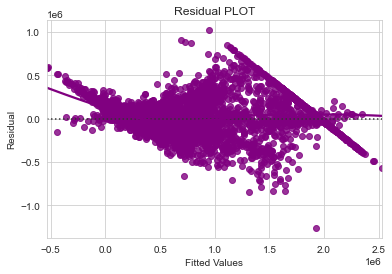

In [231]:
sns.set_style("whitegrid")
sns.residplot(fitted1,residual1,color="purple",lowess=True)
plt.xlabel("Fitted Values")
plt.ylabel("Residual")
plt.title("Residual PLOT")
plt.show()

No pattern in residual hence linearity assumptions is satisfied

### TEST FOR NORMALITY

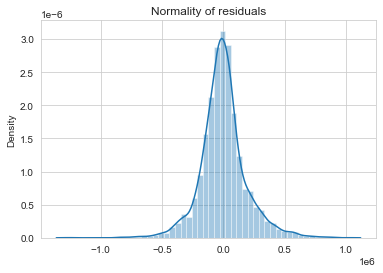

In [232]:
sns.distplot(residual1)
plt.title('Normality of residuals')
plt.show()

## QQ plot

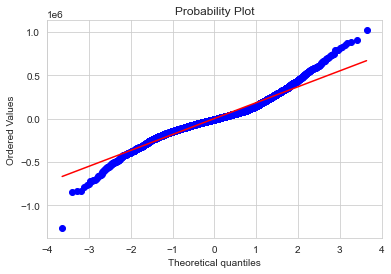

In [233]:
import pylab
import scipy.stats as stats
stats.probplot(residual,dist="norm",plot=pylab)
plt.show()

There residual line is both right and left skewed.

### TEST FOR HOMOSCEDASTICITY

Test -goldfeldquandt test

Null hypothesis : Residuals are homoscedastic

Alternate hypothesis : Residuals have hetroscedasticity

In [234]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

name = ['F statistic', 'p-value']
test = sms.het_goldfeldquandt(residual, X1_train10)
lzip(name, test)

[('F statistic', 0.9961202567159111), ('p-value', 0.5388621342048616)]

Since p-value > 0.05 we can say that the residuals are homoscedastic. This assumption is therefore valid in the data.

### Predicting on the test data

In [235]:
X1_train10.columns

Index(['const', 'Year', 'KilometersDriven', 'Mileage', 'Power', 'NewPrice',
       'Fuel_Diesel', 'Fuel_Electric', 'Transmission_Manual', 'Owner_Second',
       'Region_North', 'Region_South', 'Region_West', 'CarType_Economy-Plus',
       'CarType_Luxury', 'CarType_Premium', 'CarType_Premium-Plus', 'Seats_4',
       'Seats_7', 'Seats_8'],
      dtype='object')

In [236]:
X1_test_final = X1_test[X1_train10.columns]

In [237]:
X1_test_final.head()

,const,Year,KilometersDriven,Mileage,Power,NewPrice,Fuel_Diesel,Fuel_Electric,Transmission_Manual,Owner_Second,Region_North,Region_South,Region_West,CarType_Economy-Plus,CarType_Luxury,CarType_Premium,CarType_Premium-Plus,Seats_4,Seats_7,Seats_8
2954,1.0,2016,30000.0,20.4,81.80,545200.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0,0,0,0,0,0
501,1.0,2016,105000.0,23.2,73.94,2248600.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0,0,0,0,0,0,0
17,1.0,2009,131500.0,13.8,68.00,2483800.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1,0,0,0,0,0,0
232,1.0,2014,33750.0,15.6,70.02,967000.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1,0,0,0,0,0,0
716,1.0,2017,35000.0,24.3,88.50,1065000.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0


In [238]:
y1_pred = olsres9.predict(X1_test_final)

### Checking the performance on train and test: metric used - RMSE

In [239]:
#Checking root mean squared error on both train and test set  

from sklearn.metrics import mean_squared_error
rms = np.sqrt(mean_squared_error(y1_train, fitted1))
print('Train error:',rms)

rms1 = np.sqrt(mean_squared_error(y1_test, y1_pred))
print('Test error:',rms1)

Train error: 187281.75511937737
Test error: 188355.44477992327


### Now we can finally see that we have low test and train error, also both the errors are comparable, so our model is not suffering from overfitting .
### Hence we can conclude the model "olsres" is good for prediction as well as inference purpose


In [240]:
olsmod9 = sm.OLS(y1_train, X1_train10)
olsres9 = olsmod9.fit()
print(olsres9.summary())

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.891
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     2423.
Date:                Fri, 26 Feb 2021   Prob (F-statistic):               0.00
Time:                        19:23:02   Log-Likelihood:                -68841.
No. Observations:                5077   AIC:                         1.377e+05
Df Residuals:                    5059   BIC:                         1.378e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                -1.088e+08 

### Feature Selection on Final Dataset

In [241]:
X_train_new = X1_train4.drop('const', axis = 1)

In [242]:
clf = LinearRegression()

# Build step forward feature selection
sfs1 = sfs(clf,k_features = 29,forward=True,
           floating=False, scoring= 'r2',
           verbose=2,
           cv=5)

 # Perform SFFS
sfs1 = sfs1.fit(X_Full, Y_Full)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    0.3s finished

[2021-02-26 19:23:02] Features: 1/29 -- score: 0.6749903632694837[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:    0.3s finished

[2021-02-26 19:23:02] Features: 2/29 -- score: 0.8005506955657289[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    0.3s finished

[2021-02-26 19:23:03] Features: 3/29 -- score: 0.8520195931326582[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

In [243]:
clf = LinearRegression()

# Build step forward feature selection
sfs1 = sfs(clf,k_features = 22,forward=True,
           floating=False, scoring= 'r2',
           verbose=2,
           cv=5)

 # Perform SFFS
sfs1 = sfs1.fit(X_Full, Y_Full)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    0.4s finished

[2021-02-26 19:23:10] Features: 1/22 -- score: 0.6749903632694837[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:    0.4s finished

[2021-02-26 19:23:10] Features: 2/22 -- score: 0.8005506955657289[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    0.4s finished

[2021-02-26 19:23:11] Features: 3/22 -- score: 0.8520195931326582[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

In [244]:
# Now Which features are important?
feat_sel_cols = list(sfs1.k_feature_idx_)
print(feat_sel_cols)

[1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 13, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27]


In [245]:
X1_train4.columns[feat_cols]

Index(['const', 'Year', 'KilometersDriven', 'Mileage', 'Power', 'NewPrice',
       'Fuel_LPG', 'Owner_Fourth & Above', 'Owner_Third', 'Region_North',
       'Region_South', 'Region_West', 'CarType_Economy-Plus', 'CarType_Luxury',
       'CarType_Premium-Plus', 'Seats_6', 'Seats_7', 'Seats_8', 'Seats_9'],
      dtype='object')

### Now we will fit a sklearn model using these features only

In [246]:
X1_train_final = X1_train4[X1_train4.columns[feat_cols]]

In [247]:
X1_train_final.columns

Index(['const', 'Year', 'KilometersDriven', 'Mileage', 'Power', 'NewPrice',
       'Fuel_LPG', 'Owner_Fourth & Above', 'Owner_Third', 'Region_North',
       'Region_South', 'Region_West', 'CarType_Economy-Plus', 'CarType_Luxury',
       'CarType_Premium-Plus', 'Seats_6', 'Seats_7', 'Seats_8', 'Seats_9'],
      dtype='object')

In [248]:
X1_test.columns

Index(['const', 'Year', 'KilometersDriven', 'Mileage', 'Engine', 'Power',
       'NewPrice', 'Fuel_Diesel', 'Fuel_Electric', 'Fuel_LPG', 'Fuel_Petrol',
       'Transmission_Manual', 'Owner_Fourth & Above', 'Owner_Second',
       'Owner_Third', 'Region_North', 'Region_South', 'Region_West',
       'CarType_Economy-Plus', 'CarType_Luxury', 'CarType_Premium',
       'CarType_Premium-Plus', 'Seats_4', 'Seats_5', 'Seats_6', 'Seats_7',
       'Seats_8', 'Seats_9', 'Seats_10'],
      dtype='object')

In [249]:
#Creating new x_test with the same 18 variables that we selected for x_train
X1_test_final = X1_test[X1_train_final.columns]

In [250]:
#Fitting linear model

from sklearn.linear_model import LinearRegression
linearregression = LinearRegression()                                    
linearregression.fit(X1_train_final, y1_train)                                  

print("Intercept of the linear equation:", linearregression.intercept_) 
print("\nCOefficients of the equation are:", linearregression.coef_)

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

predicted1 = linearregression.predict(X1_train_final)
pred1 = linearregression.predict(X1_test_final)   

Intercept of the linear equation: [-1.16605713e+08]

COefficients of the equation are: [[ 0.00000000e+00  5.79099077e+04 -4.12194804e-01 -3.81804287e+03
   4.71531934e+03  3.60758090e-02  4.13617959e+04  8.96086710e+03
  -7.46585318e+03  9.20213187e+04  1.65100570e+05  1.03288383e+05
   3.52206581e+04  6.47730935e+05 -5.09317033e-11  9.94121349e+04
   2.31577311e+05  1.71552482e+05 -1.36311541e+05]]


In [251]:
# R2 Squared: on train and test
print('r2 score on train data :', r2_score(y1_train, predicted1))
print('r2 score on test data :', r2_score(y1_test, pred1))

r2 score on train data : 0.880038587998889
r2 score on test data : 0.8795915069549065


In [252]:
# RMSE on train and test data
print('rmse on train data :', mean_squared_error(y1_train, predicted1)**0.5)
print('rmse on test data :', mean_squared_error(y1_test, pred1)**0.5)

rmse on train data : 196131.44368448938
rmse on test data : 197597.5999972159


Both r2 score and RMSE shows that model fitted is good and can be used for making predictions.
we can observe here, the results from 'olsreg12' and 'linearegession' model are approximately same.

# Recommendations-

- The car sales are highest in Mumbai (13.6%) followed by Hyderabad (12.1%), Coimbatore (10.6%), Kochi (10.6%), Pune (10.5%). Mumbai and Pune account for about 25% of all used car sales. Car4U will be better served if they open a warehouse at a central location between these two cities to benefit from their proximity. This warehouse can also act as an “overflow” lot and serve both locations and help Cars4U distinguish themselves by improving service. The median prices of the used cars sold in these locations are lower, so the dealership should stock more lower end cars (economy, and economy plus) to take advantage of the economies of scale.
The cars have been categorized into 5 types based on the price.
Economy-(0-500000)
Economy-Plus-(500000-1500000)
Luxury-(1500000-5000000)
Premium-(5000000-10000000)
Premium-Plus-(10000000-40000000)
- Hyderabad, Coimbatore, and Kochi have higher car sales and sell higher priced cars. The southern distribution center must stock premium and premium plus cars also to cater to the wealthy clientele in these cities. 

- Maruti (19.9%) and Hyundai (18.5%) are the top 2 selling brands. Among all cars, 5-seater vehicles seem to have a pan-India market. 
- The Price of the cars increases with Engine capacity and power, and model year and decreases with Kilometers driven.
- Newer year Models and automatic transmission enjoy more popularity compared to their transmission counterparts.
- Diesel and petrol cars make up more than 90% of the car sales. 
- Based on the above discussed points, it is recommended that Car4U should stock larger volume of newer model, 5-seater Maruti and Hyundai cars with automatic transmission and diesel/ petrol engines as these features are in high demand. As demand increases, the dealers will have more leverage to increase used car price and, therefore, profitability.
- Electric vehicles and vehicles with alternative fuel types, though appealing, are still in their infancy and will take some time for broader market acceptance in India. As charging stations become more prevalent, electric cars may replace the ICE vehicles.
